In [9]:
from ppktstore.registry import configure_phenopacket_registry
from ppktstore.model import DefaultPhenopacketStore
from ppktstore.release.stats import PPKtStoreStats
import phenopackets as ppkt
import typing

# Import cohort via phenopacket-store-toolkit

## Method 1

In [12]:
from ppkt2synergy import CohortManager
phenopackets = CohortManager.from_ppkt_store(cohort_name='FBN1', ppkt_store_version="0.1.23")
print(phenopackets[0])

id: "PMID_12203992_Patient_D62"
subject {
  id: "Patient D62"
  time_at_last_encounter {
    age {
      iso8601duration: "P49Y"
    }
  }
  vital_status {
  }
  sex: FEMALE
}
phenotypic_features {
  type {
    id: "HP:0001166"
    label: "Arachnodactyly"
  }
}
phenotypic_features {
  type {
    id: "HP:0000767"
    label: "Pectus excavatum"
  }
}
phenotypic_features {
  type {
    id: "HP:0001065"
    label: "Striae distensae"
  }
}
phenotypic_features {
  type {
    id: "HP:0002650"
    label: "Scoliosis"
  }
}
phenotypic_features {
  type {
    id: "HP:0001083"
    label: "Ectopia lentis"
  }
}
phenotypic_features {
  type {
    id: "HP:0000545"
    label: "Myopia"
  }
}
phenotypic_features {
  type {
    id: "HP:0001382"
    label: "Joint hypermobility"
  }
}
phenotypic_features {
  type {
    id: "HP:0001634"
    label: "Mitral valve prolapse"
  }
}
phenotypic_features {
  type {
    id: "HP:0001763"
    label: "Pes planus"
  }
}
phenotypic_features {
  type {
    id: "HP:0000218"

In [11]:
print(f"Number of patients by FBN1: {len(phenopackets)}")

Number of patients by FBN1: 144


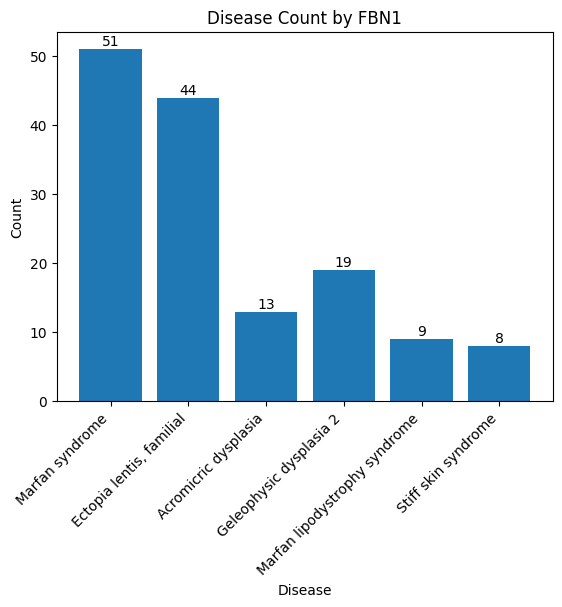

In [12]:
from collections import Counter
import matplotlib.pyplot as plt

def diseases_count_table(phenopackets:typing.List[ppkt.Phenopacket]) -> typing.Dict[str, int]:
    """ 
    Returns:
        A dictionary with key=disease label and value=number of phenopackets in the cohort with the disease
    """
    diseases= []
    for phenopacket in phenopackets:
        if len(phenopacket.diseases) == 0:
            raise ValueError("Empty disease list")
        if len(phenopacket.diseases) != 1:
            print("Warning, number of diseases ", len(phenopacket.diseases))
        #if len(phenopacket.diseases) == 1:
        diseases.append(phenopacket.diseases[0].term.label)
    return Counter(diseases)

diseases_count = diseases_count_table(phenopackets)

labels = list(diseases_count.keys())
counts = list(diseases_count.values())

# plot graph to show diseases and count
plt.bar(labels, counts)
plt.xlabel('Disease')
plt.ylabel('Count')
plt.title('Disease Count by FBN1')
plt.xticks(rotation=45, ha="right") 
for i, count in enumerate(counts):
    plt.text(i, count + 0.1, str(count), ha='center', va='bottom') 
plt.show()



In [13]:
def HPO_count_table(phenopackets: list) -> int:
    HPOs= list()
    for phenopacket in phenopackets:
        if len(phenopacket.phenotypic_features) == 0:
            raise ValueError("Empty disease list")
        for phenotype in phenopacket.phenotypic_features:
            HPOs.append(phenotype.type.label)
        distribution = Counter(HPOs)
    return len(set(HPOs)),distribution

HPOs_count, distribution = HPO_count_table(phenopackets)
print(f'Number of distinct HPOs by FBN1: {HPOs_count}')
print(distribution)

Number of distinct HPOs by FBN1: 109
Counter({'Joint hypermobility': 118, 'Mitral valve prolapse': 113, 'Ectopia lentis': 109, 'Pectus excavatum': 104, 'Arachnodactyly': 103, 'Aortic root aneurysm': 97, 'Scoliosis': 93, 'High palate': 89, 'Myopia': 88, 'Pectus carinatum': 88, 'Tall stature': 88, 'Retinal detachment': 83, 'Striae distensae': 75, 'Mitral regurgitation': 70, 'Short stature': 62, 'Stiff skin': 59, 'Disproportionate tall stature': 51, 'Deeply set eye': 47, 'Dolichocephaly': 46, 'Aortic regurgitation': 43, 'Glaucoma': 43, 'Reduced upper to lower segment ratio': 42, 'Aortic aneurysm': 41, 'Pes planus': 37, 'Dental crowding': 33, 'Limited elbow extension': 33, 'Lens coloboma': 33, 'Inguinal hernia': 33, 'Malar flattening': 33, 'Short foot': 32, 'Short palm': 32, 'Mitral stenosis': 31, 'Tricuspid stenosis': 31, 'Aortic valve stenosis': 31, 'Strabismus': 30, 'Severe short stature': 29, 'Moderately short stature': 29, 'Mild short stature': 29, 'Ascending aortic dissection': 28, '

## Method 2

In [15]:
def filter_cohorts(
    store: DefaultPhenopacketStore,
    cohort_names: typing.List[str]
) -> DefaultPhenopacketStore:
    """
    Filter cohorts from a DefaultPhenopacketStore by specified cohort names.

    :param store: Original DefaultPhenopacketStore instance.
    :param cohort_names: List of cohort names to include in the new store.
    :return: A new DefaultPhenopacketStore containing only the specified cohorts.
    """
    # Filter the cohorts based on the provided list of cohort names
    filtered_cohorts = [
        cohort for cohort in store.cohorts() if cohort.name in cohort_names
    ]

    # Return a new DefaultPhenopacketStore with the filtered cohorts
    return DefaultPhenopacketStore(
        name=f"{store.name}_filtered",  
        path=store.path, 
        cohorts=filtered_cohorts,  # only the filtered cohorts
    )


registry = configure_phenopacket_registry()
with registry.open_phenopacket_store(release="0.1.22") as ps:
    phenopackets = filter_cohorts(
    store=ps,  
    cohort_names=["FBN1"]  # Build a new phenopacketstore with cohort FBN1
    )
    stats = PPKtStoreStats(phenopackets)
    df = stats.get_summary_df()
    print(df.head())
    print(f'Number of patients by FBN1: {df.shape[0]}')
    diseases_count = stats.get_counts_per_disease_df()
    print(f'Number of Diseases by FBN1: {diseases_count}')
    HPOs_count = stats._get_total_and_unique_hpo_counts(phenopackets)
    print(f'Number of distinct HPOs by FBN1: {HPOs_count}')


     patient_id cohort   disease_id                   disease  gene  \
0   Patient D62   FBN1  OMIM:154700           Marfan syndrome  FBN1   
1   Patient B47   FBN1  OMIM:154700           Marfan syndrome  FBN1   
2     Patient 4   FBN1  OMIM:129600  Ectopia lentis, familial  FBN1   
3   Patient D19   FBN1  OMIM:154700           Marfan syndrome  FBN1   
4  AD Family 20   FBN1  OMIM:102370      Acromicric dysplasia  FBN1   

                  allele_1 allele_2           PMID  \
0    NM_000138.5:c.2047T>C           PMID:12203992   
1    NM_000138.5:c.3058A>G           PMID:11175294   
2    NM_000138.5:c.1879C>T           PMID:33576469   
3  NM_000138.5:c.5422+1G>A           PMID:12203992   
4    NM_000138.5:c.5182G>A           PMID:21683322   

                                            filename  
0  C:\Users\Lenovo\phenopacket-store\0.1.22.zip/....  
1  C:\Users\Lenovo\phenopacket-store\0.1.22.zip/....  
2  C:\Users\Lenovo\phenopacket-store\0.1.22.zip/....  
3  C:\Users\Lenovo\phenopack

# CohortHPO Correlation Test

In [4]:
import scipy.stats
from typing import Union
import numpy as np
from sklearn.metrics import matthews_corrcoef

def get_status_for_terms(patient, hpo_id_A: str, hpo_id_B: str) -> Union[tuple, None]:
    """
    Checks the statuses (observed or excluded) of two HPO term IDs in a patient's phenotype data.

    Args:
        phenotype: A PhenotypicFeature object containing the patient's phenotype data.
        hpo_id_A: The first HPO term ID to check.
        hpo_id_B: The second HPO term ID to check.

    Returns:
        tuple: A tuple (status_A, status_B) where each status is:
            - 1 if the phenotype is observed (not excluded).
            - 0 if the phenotype is excluded.
            - None if the HPO term is not present in the phenotype.
    """
    status_A = status_B = None

    for phenotype_feature in patient.phenotypic_features:
        if phenotype_feature.type.id == hpo_id_A:
            status_A = 0 if phenotype_feature.excluded else 1
        elif phenotype_feature.type.id == hpo_id_B:
            status_B = 0 if phenotype_feature.excluded else 1
    
        # Early stop if both statuses are found
        if status_A is not None and status_B is not None:
            return status_A, status_B    

    return None


def calculate_mcc_and_p(observed_status_A:list, observed_status_B:list)->tuple:
    """
    Calculate the Matthews Correlation Coefficient (MCC) and its associated p-value using a contingency table and chi-square test.

    Args:
        observed_status_A: List of 0/1 values for variable A.
        observed_status_B: List of 0/1 values for variable B.

    Returns:
        tuple: (mcc, p_value)
    """
    contingency_table = np.array([
        [sum((np.array(observed_status_A) == 1) & (np.array(observed_status_B) == 1)),
         sum((np.array(observed_status_A) == 1) & (np.array(observed_status_B) == 0))],
        [sum((np.array(observed_status_A) == 0) & (np.array(observed_status_B) == 1)),
         sum((np.array(observed_status_A) == 0) & (np.array(observed_status_B) == 0))]
    ])
    chi2, p_value, _, _ = scipy.stats.chi2_contingency(contingency_table)
    mcc = matthews_corrcoef(observed_status_A, observed_status_B)
    return mcc, p_value


def test_hpo_terms(cohort: str, hpo_id_A: str, hpo_id_B: str):
    """
    Perform correlation tests (Spearman and MCC) between two HPO terms in a cohort of patients.

    Args:
        cohort: The name of the patient cohort to analyze.
        hpo_id_A: The first HPO term ID to correlate.
        hpo_id_B: The second HPO term ID to correlate.
        url: The URL of the HPO ontology in JSON format.

    Returns:
        dict: A dictionary containing correlation coefficients and p-values for each test.
        If the data is insufficient (< 30 samples), an error message is returned.
    """
   
    observed_status_A = []
    observed_status_B = []
    
    # Import cohort
    registry = configure_phenopacket_registry()
    with registry.open_phenopacket_store(release="0.1.23") as ps:
        patients = list(ps.iter_cohort_phenopackets(cohort))
     
    for patient in patients:
        result = get_status_for_terms(patient, hpo_id_A, hpo_id_B)
        if result is not None:
            status_A, status_B = result
            observed_status_A.append(status_A)
            
            observed_status_B.append(status_B)

    # If the number of observed data points is less than 30, return an error message. 
    # This threshold ensures sufficient statistical power for reliable correlation tests.
    if len(observed_status_A) < 30:
        return {"error": "Not enough data for correlation tests"}

    # Spearman test
    spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)

    # MCC
    mcc, mcc_p = calculate_mcc_and_p(observed_status_A, observed_status_B)

    return {
        "Spearman": {"correlation": spearman_corr, "p_value": spearman_p},
        "MCC": {"correlation": mcc, "p_value": mcc_p}
    }

In [4]:
import hpotk
import pandas as pd

def generate_hpo_term_status_matrix(cohort: str) -> pd.DataFrame:
    """
    Generate a binary matrix of HPO term statuses for all patients in a cohort.

    Args:
        cohort: The patient cohort, a collection of patient objects with phenotypic features.

    Returns:
        A pandas DataFrame:
            - Rows represent patients (indexed by their IDs).
            - Columns represent unique HPO IDs (sorted alphabetically).
            - Values are binary (1: observed, 0: excluded).
    """

    registry = configure_phenopacket_registry()
    with registry.open_phenopacket_store(release="0.1.23") as ps:
        patients = list(ps.iter_cohort_phenopackets(cohort))
    hpo_ids = set()
    status_data = {}

    # Single pass to collect HPO IDs and patient statuses
    for patient in patients:
        status_data[patient.id] = {}
        for feature in patient.phenotypic_features:
            hpo_id = feature.type.id
            hpo_ids.add(hpo_id)
            status_data[patient.id][hpo_id] = 0 if feature.excluded else 1

    # Create a sorted list of unique HPO IDs
    hpo_ids = sorted(hpo_ids)

    # Convert the status_data dictionary to a DataFrame
    status_matrix = pd.DataFrame.from_dict(status_data, orient='index', columns=hpo_ids)

    return status_matrix



def find_unrelated_hpo_terms(
        hpo_id: str, 
        cohort:str, 
        url= 'https://github.com/obophenotype/human-phenotype-ontology/releases/download/v2023-10-09/hp.json') -> dict:
    """
    Check if a given HPO ID  exists in the filtered terms_status DataFrame, where columns (HPO terms) with more than 50% missing values are removed.
    If it exists, return unrelated terms (terms not ancestors, descendants, or the term itself).
    If the term is not found, notify the user.

    Args:
        term: The HPO ID to check.
        cohort: The patient cohort to be analyzed.
        url: The URL or path to load the HPO ontology in JSON format.

    Returns:
        A dictionary with 'status' indicating success or failure, and 'data' containing the unrelated terms
        or a failure message.
    """
    # Load the HPO ontology
    hpo = hpotk.load_minimal_ontology(url)
    terms_status = generate_hpo_term_status_matrix(cohort)
    
    # Remove columns with None values exceeding 50%
    terms_status = terms_status.loc[:, terms_status.isna().mean() <= 0.5]

    # Check if the term exists in the filtered terms_status
    if hpo_id not in terms_status.columns:
        return {
            "error": f"The HPO term '{hpo_id}' was not found. It might not be relevant to this cohort or was excluded because it appears in less than 50% of patients. Please check the term and its applicability."

        }

    # Get ancestors and descendants of the term
    ancestors = hpo.graph.get_ancestors(hpo_id)
    descendants = hpo.graph.get_descendants(hpo_id)

    # Get unrelated terms
    related_terms = set(ancestors) | set(descendants) | {hpo_id}
    unrelated_terms = [col for col in terms_status.columns if col not in related_terms]

    return unrelated_terms

In [9]:
result = find_unrelated_hpo_terms("HP:0001634",'FBN1')
print(result)

['HP:0000098', 'HP:0000218', 'HP:0000541', 'HP:0000545', 'HP:0000767', 'HP:0000768', 'HP:0001065', 'HP:0001083', 'HP:0001166', 'HP:0001382', 'HP:0002616', 'HP:0002650']


In [ ]:
results = test_hpo_terms('FBN1', 'HP:0001634', 'HP:0001382')
print(results)
results = test_hpo_terms('FBN1', 'HP:0001634', 'HP:0000098')
print(results)
results = test_hpo_terms('FBN1', 'HP:0001634', 'HP:0000218')
print(results)

In [50]:
from ppkt2synergy import CohortStats
from ppkt2synergy import CohortManager
phenopackets = CohortManager.from_ppkt_store(cohort_name='FBN1', ppkt_store_version="0.1.23")
cohortstats = CohortStats(phenopackets=phenopackets)

In [51]:
print(cohortstats.filter_hpo_terms_and_dropna('HP:0000218','HP:0000678'))
print(len(cohortstats.filter_hpo_terms_and_dropna('HP:0000218','HP:0000678')))

                           HP:0000218  HP:0000678
PMID_12203992_Patient_D62         0.0         0.0
PMID_12203992_Patient_D19         0.0         0.0
PMID_12203992_Patient_B1          1.0         1.0
PMID_12203992_Patient_B52         1.0         1.0
PMID_12203992_Patient_D15         0.0         0.0
PMID_12203992_Patient_D55         0.0         0.0
PMID_12203992_Patient_B45         0.0         0.0
PMID_12203992_Patient_B65         1.0         1.0
PMID_12203992_Patient_D59         1.0         1.0
PMID_12203992_Patient_D63         0.0         0.0
PMID_12203992_Patient_B19         1.0         1.0
PMID_12203992_Patient_B62         0.0         0.0
PMID_12203992_Patient_B18         1.0         1.0
PMID_12203992_Patient_B79         0.0         0.0
PMID_12203992_Patient_D7          0.0         0.0
PMID_12203992_Patient_B43         1.0         1.0
PMID_12203992_Patient_B9          0.0         0.0
PMID_12203992_Patient_B37         0.0         0.0
PMID_12203992_Patient_B60         0.0         0.0


In [56]:
print(cohortstats.filter_hpo_terms_and_dropna('HP:0004942','HP:0030053'))
print(len(cohortstats.filter_hpo_terms_and_dropna('HP:0004942','HP:0030053')))

                           HP:0004942  HP:0030053
PMID_12203992_Patient_D19         1.0         0.0
PMID_12203992_Patient_B1          1.0         0.0
PMID_12203992_Patient_D15         1.0         0.0
PMID_12203992_Patient_B45         1.0         0.0
PMID_12203992_Patient_B65         1.0         0.0
PMID_12203992_Patient_B19         1.0         0.0
PMID_12203992_Patient_B62         1.0         0.0
PMID_12203992_Patient_B18         1.0         0.0
PMID_12203992_Patient_B43         1.0         0.0
PMID_12203992_Patient_B9          1.0         0.0
PMID_12203992_Patient_B37         1.0         0.0
PMID_12203992_Patient_B60         1.0         0.0
PMID_12203992_Patient_D26         1.0         0.0
PMID_12203992_Patient_D5          1.0         0.0
PMID_12203992_Patient_B3          1.0         0.0
PMID_12203992_Patient_D40         1.0         0.0
PMID_12203992_Patient_D2          1.0         0.0
PMID_12203992_Patient_B51         1.0         0.0
PMID_12203992_Patient_D16         1.0         0.0


In [2]:
print(cohortstats.test_hpo_terms('HP:0001634', 'HP:0001382'))
print(cohortstats.test_hpo_terms('HP:0001634', 'HP:0000098'))
print(cohortstats.test_hpo_terms('HP:0001634', 'HP:0000218'))

{'Spearman': 0.2852389877703285, 'Spearman_p_value': 0.0033360102443672863, "Kendall's Tau": 0.2852389877703285, 'Kendall_p_value': 0.0037932820531584636, 'Phi': 0.28523898777032847, 'Phi_p_value': 0.00924980801359363}
{'Spearman': 0.19746760776263075, 'Spearman_p_value': 0.1013043073802101, "Kendall's Tau": 0.19746760776263075, 'Kendall_p_value': 0.10094506199765259, 'Phi': 0.19746760776263075, 'Phi_p_value': 0.2198408687499278}
{'Spearman': 0.34871490092681423, 'Spearman_p_value': 0.002168726652821395, "Kendall's Tau": 0.3487149009268143, 'Kendall_p_value': 0.002701932957866206, 'Phi': 0.3487149009268143, 'Phi_p_value': 0.006124831856429692}


# Refactor FBN1 notebook 

In [1]:
import os
from pyphetools.creation import TemplateImporter
from pyphetools.creation.metadata import MetaData
from google.protobuf.json_format import MessageToJson 

metadata = MetaData(
        created_by='anonymous biocurator',
    )

# Path to the folder containing the input .xlsx files
input_folder = "test/data/input"
# Path to the folder where the output .json files will be saved
output_folder = "test/data/cohorts/FBN1"
os.makedirs(output_folder, exist_ok=True)  # Ensure the output folder exists

# ORCID identifier of the biocurator and the set of structural variants to handle
created_by = "0000-0002-0736-9199"

# Iterate over each file in the input folder
for file_name in os.listdir(input_folder):
    if file_name.endswith(".xlsx"):  
        template_path = os.path.join(input_folder, file_name) 
        
        # Import the template and create phenopackets
        try:
            timporter = TemplateImporter(template=template_path, created_by="0000-0002-0736-9199")
            individual_list, cvalidator = timporter.import_phenopackets_from_template()
        except Exception as e:
            print(f"Error processing {file_name}: {e}")
            continue

        
        # Save each individual as a JSON file
        for individual in individual_list:
            ga4gh_ppkt = individual.to_ga4gh_phenopacket(metadata)
            output_file = os.path.join(output_folder, f"{ga4gh_ppkt.id}.json")  # Output path for the JSON
            with open(output_file, "w") as f:
                f.write(MessageToJson(ga4gh_ppkt)) 
            
        print(f"Processed {file_name} and saved JSON files to {output_folder}")


HPO version 2024-12-12
Created encoders for 50 fields
Importing OMIM:102370, Acromicric dysplasia, HGNC:3603, FBN1,  NM_000138.5
We output 13 GA4GH phenopackets to the directory phenopackets
Processed FBN1_ACMICD_individuals.xlsx and saved JSON files to test/data/cohorts/FBN1
HPO version 2024-12-12
Created encoders for 52 fields
Importing OMIM:614185, Geleophysic dysplasia 2, HGNC:3603, FBN1,  NM_000138.5
We output 19 GA4GH phenopackets to the directory phenopackets
Processed FBN1_GPHYSD2_individuals.xlsx and saved JSON files to test/data/cohorts/FBN1
HPO version 2024-12-12
Created encoders for 36 fields
Importing OMIM:129600, Ectopia lentis, familial, HGNC:3603, FBN1,  NM_000138.5
[INFO] encoding variant "c.367T>C"
https://rest.variantvalidator.org/VariantValidator/variantvalidator/hg38/NM_000138.5%3Ac.367T>C/NM_000138.5?content-type=application%2Fjson
[INFO] encoding variant "c.364C>T"
https://rest.variantvalidator.org/VariantValidator/variantvalidator/hg38/NM_000138.5%3Ac.364C>T/NM_

SystemExit: 1

d:\storage\jingc94\minicoda3\envs\myenv\Lib\site-packages\IPython\core\interactiveshell.py:3585: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [1]:
%matplotlib widget

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import mplcursors  # For interactive hover functionality
from ppkt2synergy import CohortStats
from ppkt2synergy import CohortManager
from scipy.stats import norm
from scipy.stats import chi2_contingency



def calculate_spearman_matrix(cohortstats:CohortStats,stats_name: str):
    # stats_name: [Kendall, Spearman, Phi]
    term_matrix = cohortstats.hpo_term_observation_matrix
    term_matrix = term_matrix.loc[:, term_matrix.notna().sum(axis=0) >= 30]

    hpo_ids = term_matrix.columns  
    n_terms = len(hpo_ids)  

    matrix = np.full((n_terms, n_terms), np.nan)
    pvalue_matrix = np.full((n_terms, n_terms), np.nan)

    for i, hpo_id_A in enumerate(hpo_ids):
        for j in range(i + 1, n_terms):
            hpo_id_B = hpo_ids[j]
            try:
                result = cohortstats.test_hpo_terms(hpo_id_A, hpo_id_B)
                if result is not None:
                    matrix[i, j] = result[stats_name]
                    matrix[j, i] = result[stats_name]
                    pvalue_matrix[i, j] = result[f'{stats_name}_p_value']
                    pvalue_matrix[j, i] = result[f'{stats_name}_p_value']
                else:
                    continue
            except ValueError:
                continue
    df = pd.DataFrame(matrix, index=hpo_ids, columns=hpo_ids)
    pvalue_df = pd.DataFrame(pvalue_matrix, index=hpo_ids, columns=hpo_ids)
    df.rename(index=cohortstats.hpo_labels, columns=cohortstats.hpo_labels, inplace=True)
    pvalue_df.rename(index=cohortstats.hpo_labels, columns=cohortstats.hpo_labels, inplace=True)

    return df, pvalue_df

def plot_heatmaps(spearman_df, pvalue_df, p_threshold=0.05, title='Spearman'):
    fig, axes = plt.subplots(1, 2, figsize=(14,7), dpi=100)

    # Create a mask for NaN values
    spearman_mask = spearman_df.isna()

    # Plot the Spearman correlation heatmap
    sns.heatmap(
        spearman_df,
        cmap='RdBu',  # Colormap for the correlation values
        square=True,
        cbar_kws={"label": f"{title} Correlation"},
        xticklabels=True,
        yticklabels=True,
        linewidths=0.5,
        ax=axes[0],
        mask=spearman_mask,  # Mask NaN values
        vmin=-1,  # Ensure the color scale is from -1 to 1 for correlation
        vmax=1,
    )

    # Overlay gray color for NaN values
    axes[0].imshow(
        np.where(spearman_mask, 1, np.nan),  # Highlight NaN areas
        cmap=ListedColormap(['gray']),  # Use gray for NaN
        alpha=0.5,  # Adjust transparency
        aspect='auto',
        extent=axes[0].get_xlim() + axes[0].get_ylim(),
        origin='upper'
    )

    axes[0].set_title(f"{title} Correlation Heatmap")
    axes[0].tick_params(axis='both', labelsize=max(5, min(12, 200//spearman_df.shape[0])))
    axes[0].set_xlabel("HPO Terms")
    axes[0].set_ylabel("HPO Terms")

    # Process p-value data: transform to -log10(p-value)
    pvalue_data = pvalue_df.copy()
    if np.all(np.isnan(pvalue_data)):
        raise ValueError("pvalue_matrix is fully NaN")

    # Convert p-value to z-score, handling NaNs
    zscore_data = pvalue_data.applymap(lambda p: norm.ppf(1 - p / 2) if pd.notna(p) else np.nan)

    # Create a mask for NaN values in the z-score matrix
    zscore_mask = zscore_data.isna()

    # Plot the z-score heatmap
    sns.heatmap(
        zscore_data,
        cmap='coolwarm',
        mask=zscore_mask,  # Mask NaN values
        cbar_kws={"label": "Z-score"},
        square=True,
        xticklabels=True,
        yticklabels=True,
        linewidths=0.5,
        ax=axes[1],
        vmin=0,  # Minimum value for the color scale
        vmax=10,  # Adjust the maximum value based on the expected z-scores
        center=norm.ppf(1 - p_threshold / 2)  # Center around threshold z-score
    )

    # Overlay gray color for NaN values
    axes[1].imshow(
        np.where(zscore_mask, 1, np.nan),  # Highlight NaN areas
        cmap=ListedColormap(['gray']),  # Use gray for NaN
        alpha=0.5,  # Adjust transparency
        aspect='auto',
        extent=axes[1].get_xlim() + axes[1].get_ylim(),
        origin='upper'
    )

    axes[1].set_title(f"{title} Z-score Heatmap")
    axes[1].tick_params(axis='both', labelsize=max(5, min(12, 200//spearman_df.shape[0])))
    axes[1].set_xlabel("HPO Terms")
    axes[1].set_ylabel("HPO Terms")

    # Set the main title for the entire figure
    fig.suptitle(title, fontsize=16)

    # Adjust layout to prevent overlap
    plt.tight_layout()

    def add_hover_annotations(ax, data, title):
        cursor = mplcursors.cursor(ax.images, hover=True)
        @cursor.connect("add")
        def on_add(sel):
            row, col = int(sel.target[1]), int(sel.target[0])  # Get row and column indices
            value = data.iloc[row, col]  # Get the value at the cell
            x_label = data.columns[col]  # Get the x-axis term ID
            y_label = data.index[row]    # Get the y-axis term ID
            sel.annotation.set_text(f"{title}\n{x_label} vs {y_label}\nValue: {value:.4f}")
            sel.annotation.get_bbox_patch().set(fc="white", alpha=0.9)

    # Add hover annotations to both heatmaps
    add_hover_annotations(axes[0], spearman_df, f"{title} Correlation")
    add_hover_annotations(axes[1], pvalue_df, f"{title} Z-score")

    # Show the plot
    plt.show()

def pvalue_visualization(cohort_name: str):
    phenopackets = CohortManager.from_ppkt_store(cohort_name=cohort_name, ppkt_store_version="0.1.23")
    cohortstats = CohortStats(phenopackets=phenopackets)
    spearman_df, spearman_pvalue_df = calculate_spearman_matrix(cohortstats, stats_name='Spearman')
    Kendall_df, Kendall_pvalue_df = calculate_spearman_matrix(cohortstats, stats_name='Kendall')
    phi_df, phi_pvalue_df = calculate_spearman_matrix(cohortstats, stats_name='Phi')

    plot_heatmaps(spearman_df, spearman_pvalue_df, title="Spearman")
    plot_heatmaps(phi_df, phi_pvalue_df, title="Phi")

    # Function to calculate p-value counts less and greater than 0.05
    def count_pvalues(pvalue_df):
        return (pvalue_df < 0.05).sum().sum() / 2, (pvalue_df > 0.05).sum().sum() / 2

    # Spearman
    spearman_less, spearman_greater = count_pvalues(spearman_pvalue_df)
    print(f"Spearman - Less than 0.05: {spearman_less}, Greater than 0.05: {spearman_greater}")

    # Kendall
    kendall_less, kendall_greater = count_pvalues(Kendall_pvalue_df)
    print(f"Kendall - Less than 0.05: {kendall_less}, Greater than 0.05: {kendall_greater}")

    # Phi
    phi_less, phi_greater = count_pvalues(phi_pvalue_df)
    print(f"Phi - Less than 0.05: {phi_less}, Greater than 0.05: {phi_greater}")





In [28]:
def calculate_term_gender_frequency(filted_matrix, term_column):
    """
    Calculate the frequency of a term or disease in males and females.
    
    :param filted_matrix: pd.DataFrame, the filted matrix (including sex information)
    :param term_column: str, the column name of the term or disease
    :return: dict, containing the frequency in males and females
    """
    # Filter data for males and females
    male_data = filted_matrix[filted_matrix['sex'] == 1]
    female_data = filted_matrix[filted_matrix['sex'] == 0]

    # Calculate the frequency of the term or disease
    male_frequency = male_data[term_column].mean()  # Proportion of males with the term
    female_frequency = female_data[term_column].mean()  # Proportion of females with the term

    return {
        'male_frequency': male_frequency,
        'female_frequency': female_frequency
    }


def test_terms_gender_association(cohortstats):
    """
    Analyze the association between all terms and sex using.
    """
    filtered_hpo_matrix = cohortstats.hpo_term_observation_matrix.loc[:, cohortstats.hpo_term_observation_matrix.notna().sum(axis=0) >= 30]
    combined_hpo_matrix = filtered_hpo_matrix.join(cohortstats.sex_matrix)
    hpo_gender_matrix = {}
    hpo_gender_pvalue_matrix ={}
  
    for term, label in cohortstats.hpo_labels.items():  # Iterate over term IDs and their labels
        if term in combined_hpo_matrix.columns:  # Check if the term exists in the combined matrix
            # Extract the relevant data
            filtered_data = combined_hpo_matrix[['sex', term]].dropna()
            try:
                result = cohortstats.calculate_stats(filtered_data[term], filtered_data['sex'])
                if result is not None:
                    hpo_gender_matrix[label] = result['Phi']
                    hpo_gender_pvalue_matrix[label] = result['Phi_p_value']
                else:
                    continue
            except ValueError:
                continue
    df_phi = pd.DataFrame.from_dict(hpo_gender_matrix, orient='index', columns=['Phi'])
    df_pval = pd.DataFrame.from_dict(hpo_gender_pvalue_matrix, orient='index', columns=['Phi_p_value'])
        
    return df_phi,df_pval



def visualize_hpo_gender_association(cohort_name:str, significance_level=0.05):
    """
    Visualize the association between HPO terms and gender using a bar plot.
    Highlights significant associations.

    :param df_phi: DataFrame containing Phi values.
    :param df_pval: DataFrame containing p-values.
    :param significance_level: Threshold for significance (default 0.05).
    """
    phenopackets = CohortManager.from_ppkt_store(cohort_name=cohort_name, ppkt_store_version="0.1.23")
    cohortstats = CohortStats(phenopackets=phenopackets)
    df_phi, df_pval = test_terms_gender_association(cohortstats)
    df = df_phi.join(df_pval)
    
    df = df.reindex(df['Phi'].abs().sort_values(ascending=False).index)

    plt.figure(figsize=(10, 8))
    colors = ['red' if p <= significance_level else 'gray' for p in df['Phi_p_value']]
    
    sns.barplot(x=df.index, y=df['Phi'], palette=colors)
    plt.axhline(y=0, color='black', linewidth=0.8, linestyle='dashed')  
    plt.xticks(rotation=90)
    plt.xlabel("HPO Terms")
    plt.ylabel("Phi Coefficient")
    plt.title("HPO Term - Gender Association (Phi Coefficient)")
    plt.legend(
        labels=['Significant (p ≤ 0.05)', 'Not significant'], 
        handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10),
                 plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=10)],
        loc='upper left'
    )
    plt.text(len(df) - 1, max(df['Phi']) * 0.9, "Phi > 0 → More common in males", fontsize=12, color="blue", ha='right')
    plt.text(len(df) - 1, min(df['Phi']) * 0.9, "Phi < 0 → More common in females", fontsize=12, color="purple", ha='right')
   
    plt.tight_layout()
    plt.show()


D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:327: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:327: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:327: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_29676\2016537430.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the sam

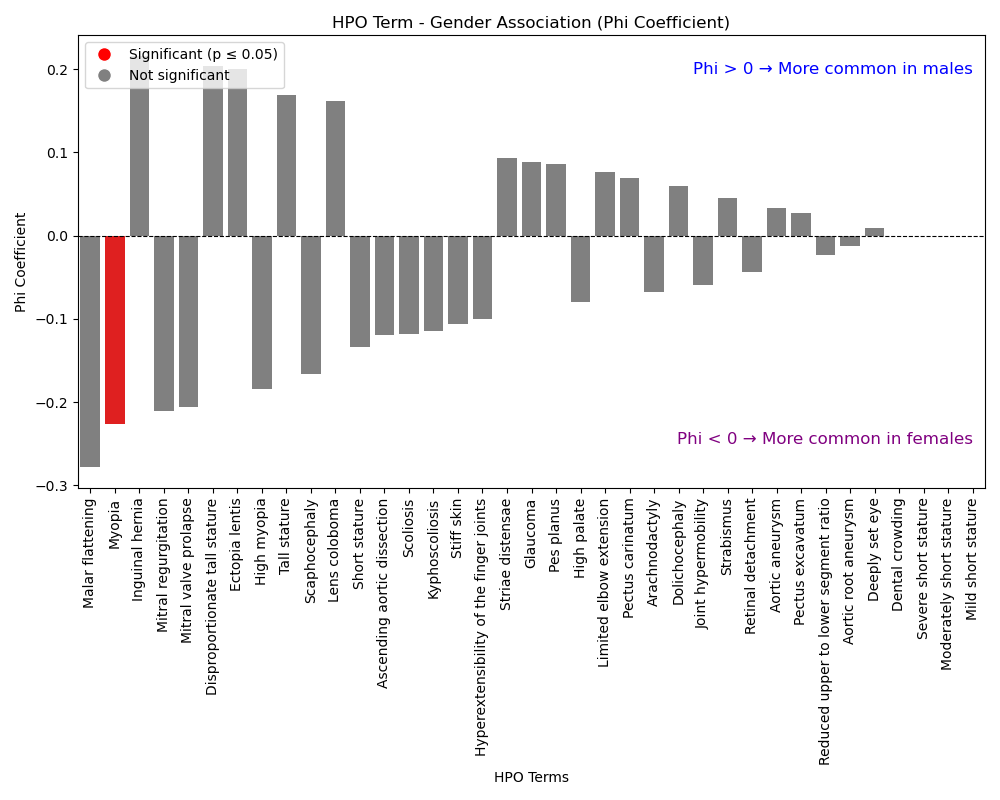

In [29]:
visualize_hpo_gender_association('FBN1')

D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:327: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:327: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:327: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:327: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observe

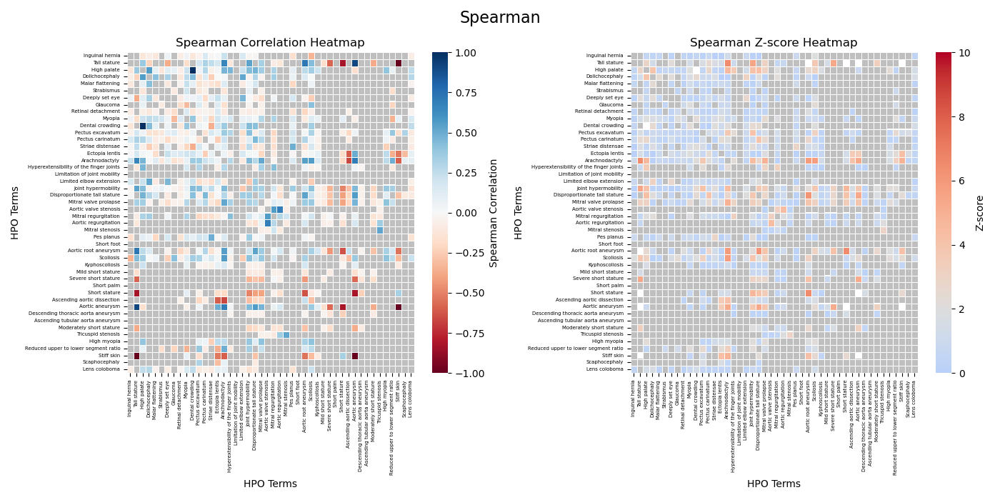

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_29676\1376119667.py:89: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  zscore_data = pvalue_data.applymap(lambda p: norm.ppf(1 - p / 2) if pd.notna(p) else np.nan)


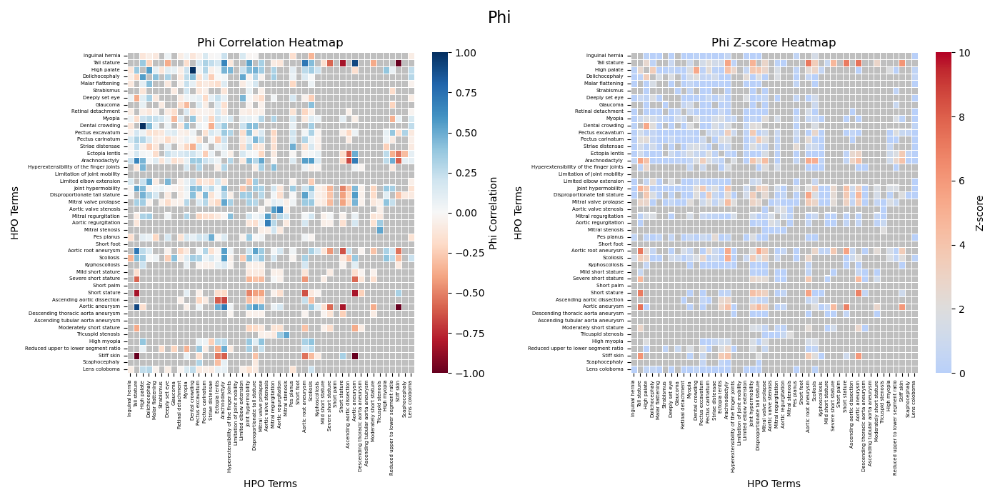

Spearman - Less than 0.05: 111.0, Greater than 0.05: 289.0
Kendall - Less than 0.05: 111.0, Greater than 0.05: 289.0
Phi - Less than 0.05: 75.0, Greater than 0.05: 325.0


In [2]:
pvalue_visualization('FBN1')

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_29676\2016537430.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df.index, y=df['Phi'], palette=colors)


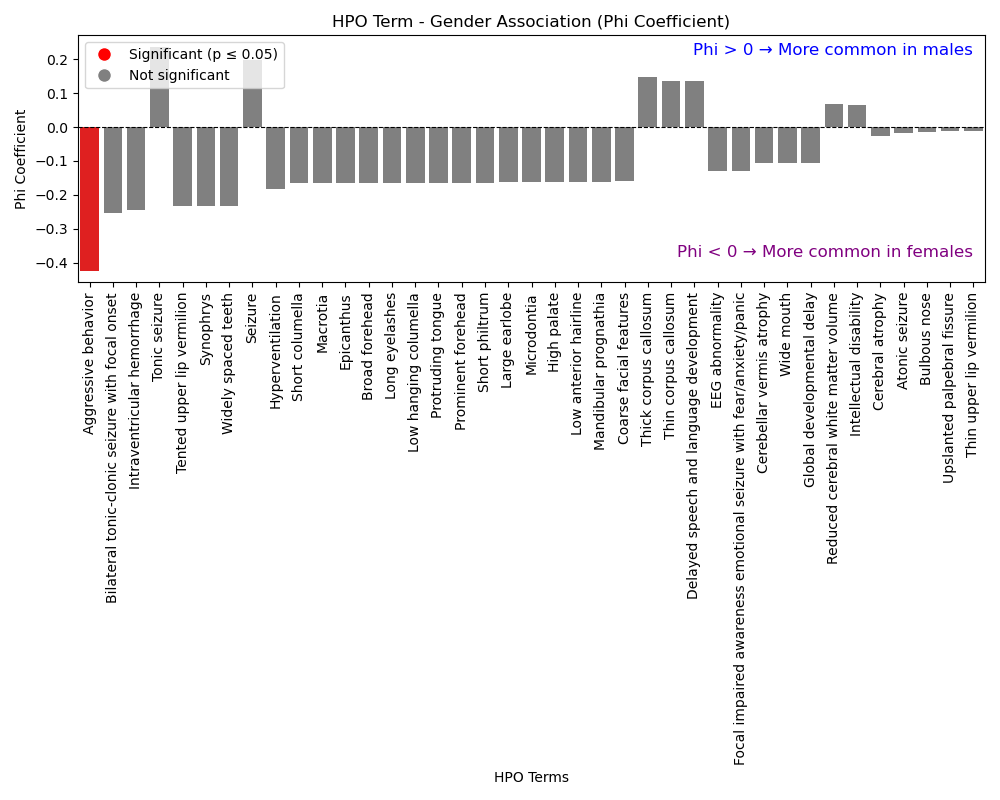

In [30]:
visualize_hpo_gender_association('CNTNAP2')

D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:231: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:231: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:231: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:231: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observe

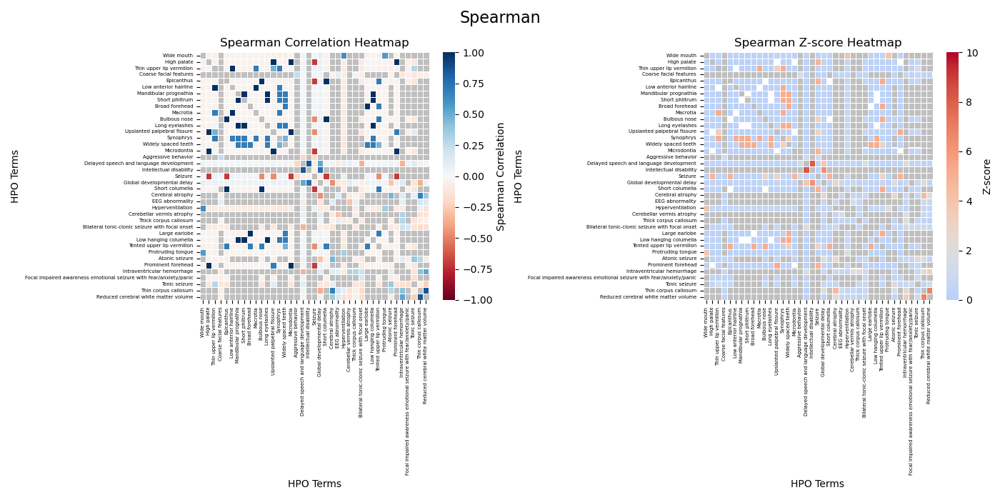

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_21076\4195799184.py:179: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  zscore_data = pvalue_data.applymap(lambda p: norm.ppf(1 - p / 2) if pd.notna(p) else np.nan)


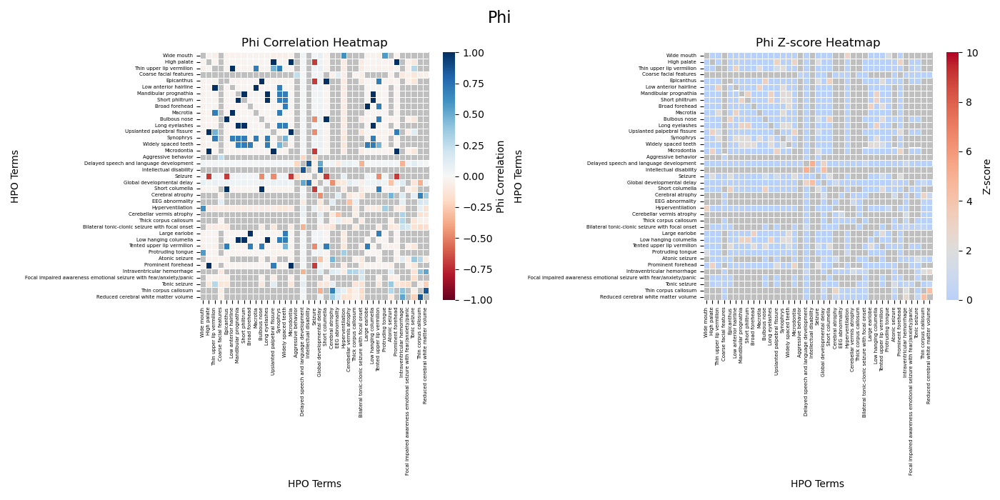

Spearman - Less than 0.05: 65.0, Greater than 0.05: 358.0
Kendall - Less than 0.05: 65.0, Greater than 0.05: 358.0
Phi - Less than 0.05: 49.0, Greater than 0.05: 374.0


In [ ]:
pvalue_visualization('CNTNAP2')

D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observe

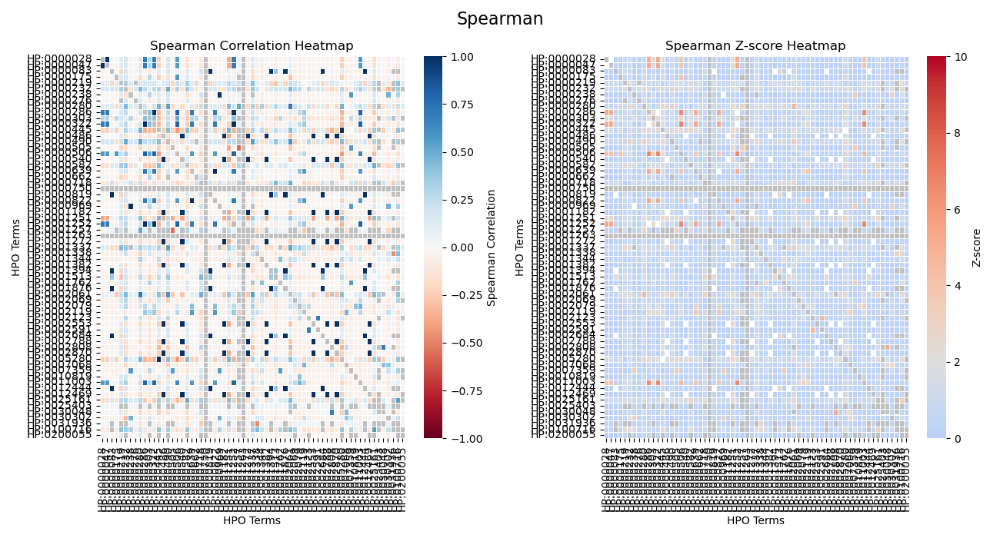

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15172\4211879390.py:176: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  zscore_data = pvalue_data.applymap(lambda p: norm.ppf(1 - p / 2) if pd.notna(p) else np.nan)


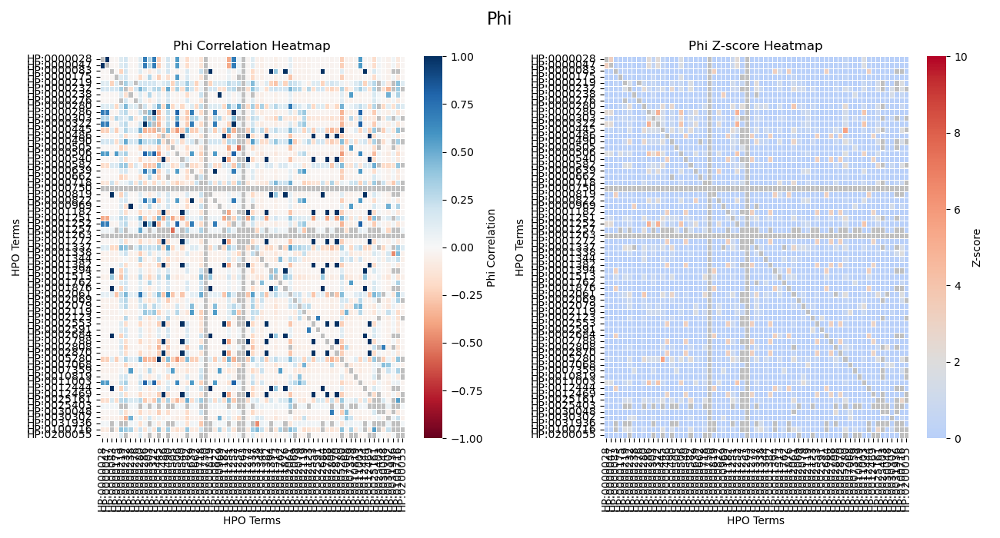

Spearman - Less than 0.05: 187.0, Greater than 0.05: 1675.0
Kendall - Less than 0.05: 184.0, Greater than 0.05: 1678.0
Phi - Less than 0.05: 108.0, Greater than 0.05: 1754.0


In [47]:
pvalue_visualization('ACBD6')


In [30]:
print(hpo.graph.is_ancestor_of('HP:0000047','HP:0000028'))
print(hpo.graph.is_descendant_of('HP:0000047','HP:0000028'))

False
False


D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observe

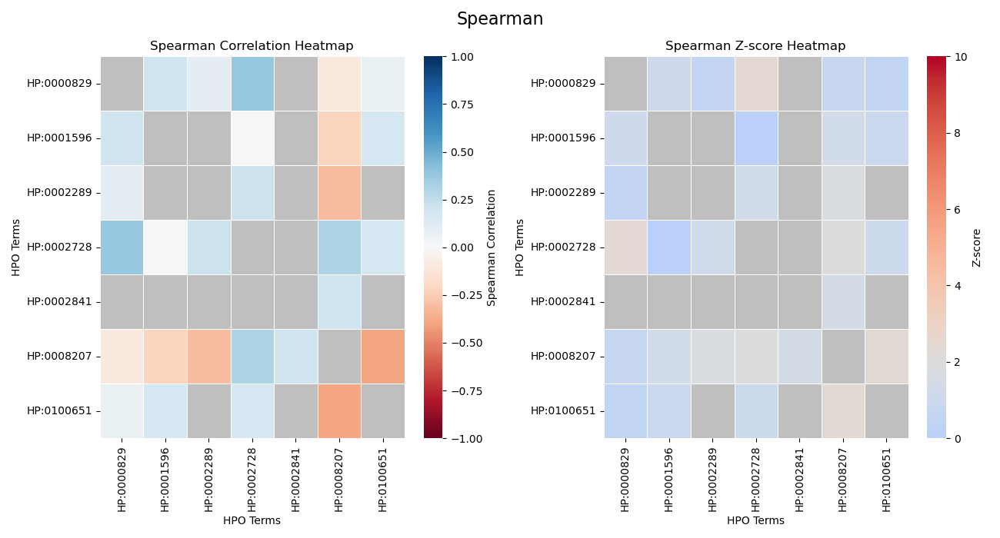

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15172\1494667310.py:86: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  zscore_data = pvalue_data.applymap(lambda p: norm.ppf(1 - p / 2) if pd.notna(p) else np.nan)


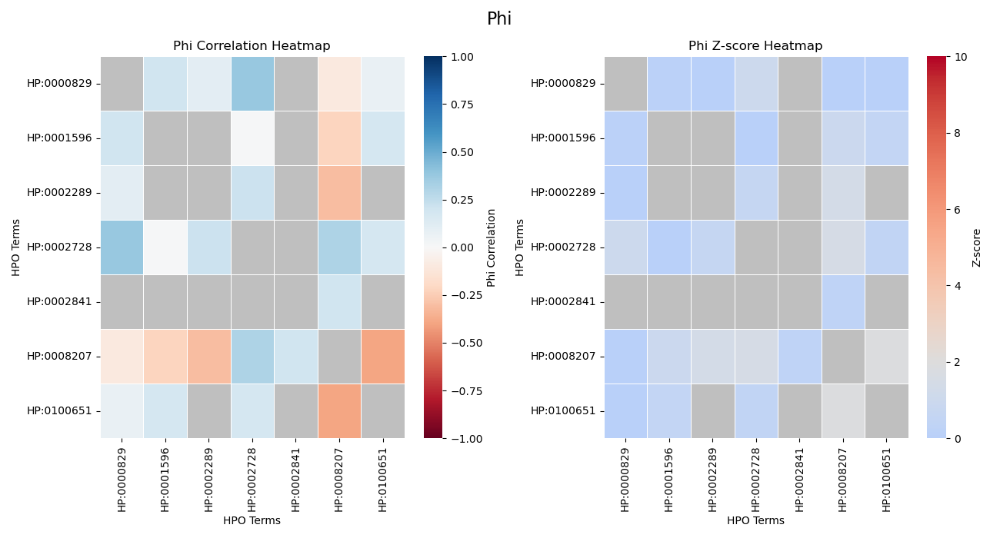

Spearman - Less than 0.05: 3.0, Greater than 0.05: 11.0
Kendall - Less than 0.05: 3.0, Greater than 0.05: 11.0
Phi - Less than 0.05: 0.0, Greater than 0.05: 14.0


In [23]:
pvalue_visualization('AIRE')

D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observe

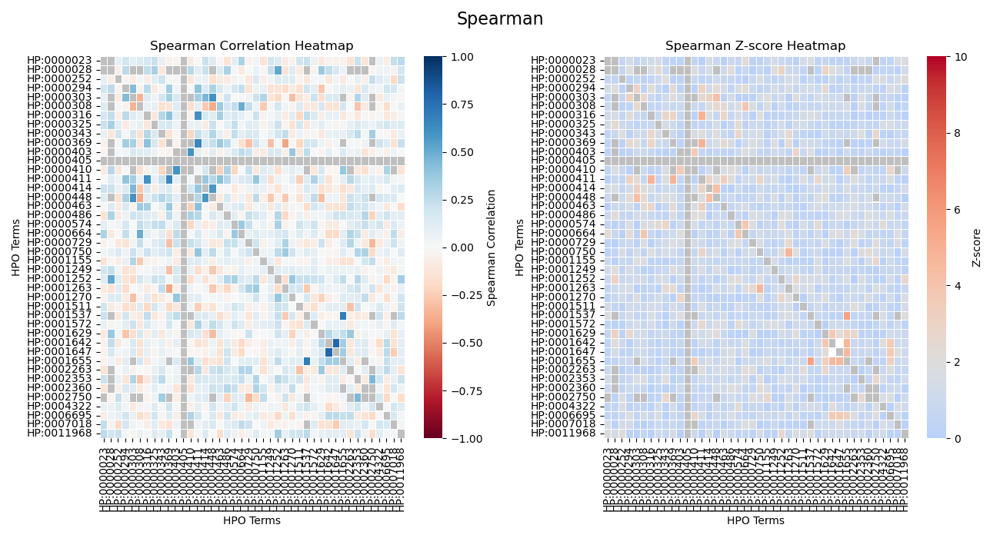

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_15172\1494667310.py:86: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  zscore_data = pvalue_data.applymap(lambda p: norm.ppf(1 - p / 2) if pd.notna(p) else np.nan)


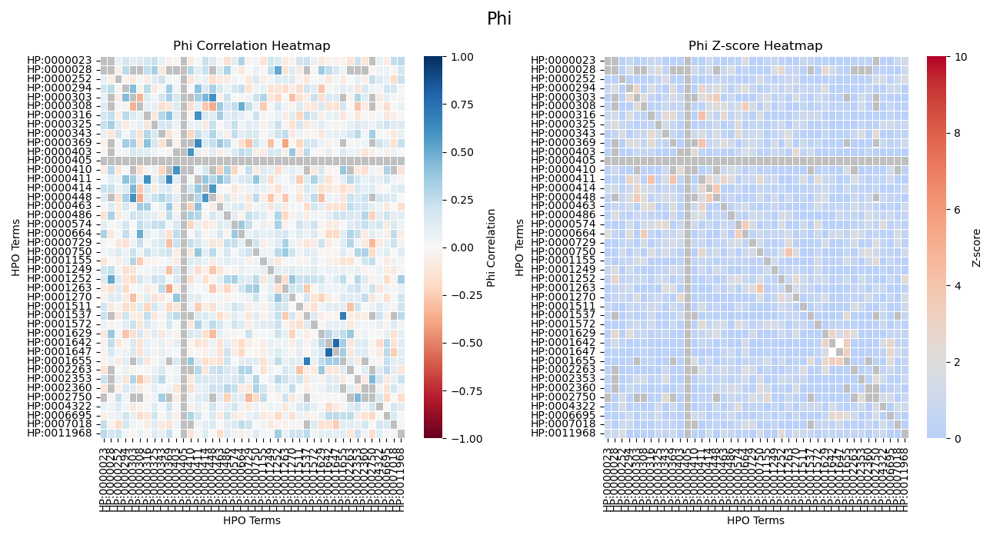

Spearman - Less than 0.05: 75.0, Greater than 0.05: 717.0
Kendall - Less than 0.05: 75.0, Greater than 0.05: 717.0
Phi - Less than 0.05: 51.0, Greater than 0.05: 741.0


In [24]:
pvalue_visualization('ANKRD11')

D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observe

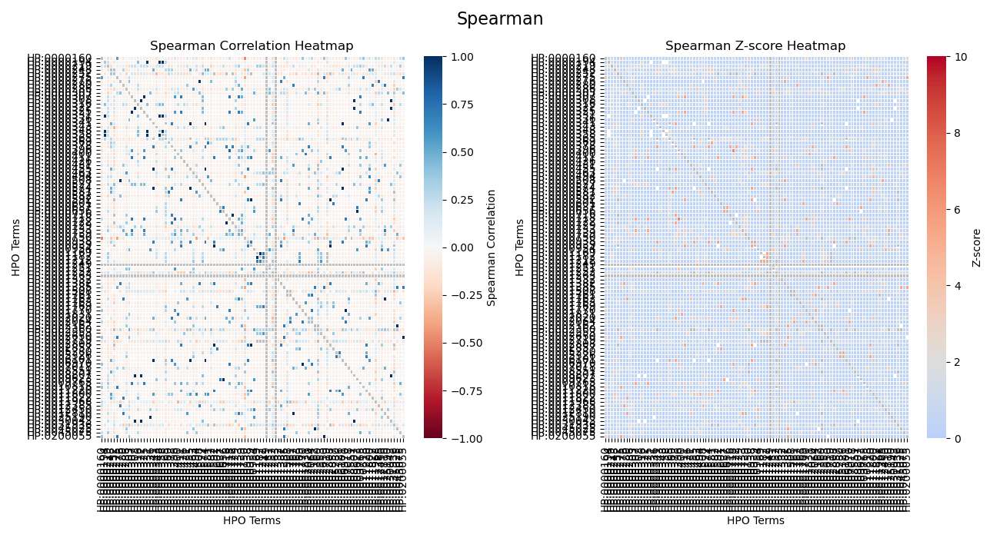

Spearman - Less than 0.05: 296.0, Greater than 0.05: 4411.0
Kendall - Less than 0.05: 296.0, Greater than 0.05: 4411.0
Phi - Less than 0.05: 109.0, Greater than 0.05: 4598.0


In [16]:
pvalue_visualization('CTCF')

D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observed_status_B)
D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\stats.py:228: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = scipy.stats.spearmanr(observed_status_A, observe

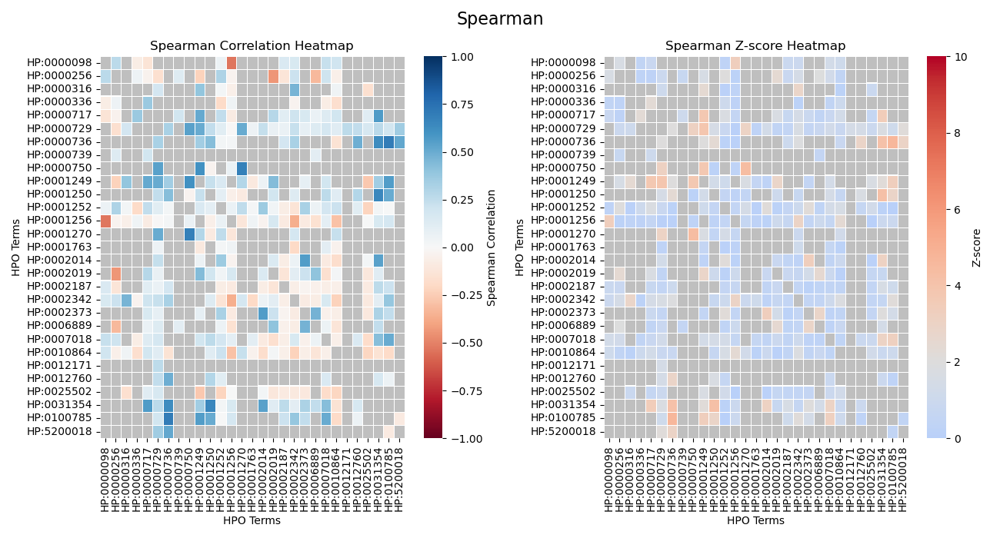

Spearman - Less than 0.05: 38.0, Greater than 0.05: 153.0
Kendall - Less than 0.05: 38.0, Greater than 0.05: 153.0
Phi - Less than 0.05: 24.0, Greater than 0.05: 167.0


In [11]:
pvalue_visualization('CHD8')

In [71]:
%matplotlib widget
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import mplcursors  # For interactive hover functionality
from ppkt2synergy import CohortDataLoader
from ppkt2synergy import CohortMatrixGenerator
from ppkt2synergy import CohortAnalyzer, HPOTermClassifier,SynergyAnalyzer
from sklearn.metrics import mutual_info_score
import statsmodels.api as sm
from imblearn.over_sampling import RandomOverSampler
from itertools import combinations
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import SelectFromModel


def plot_heatmaps(df, pvalue_df,df_renamed, pvalue_df_renamed, p_threshold=0.05, title='Spearman'):
    fig, axes = plt.subplots(1, 2, figsize=(13,6.5), dpi=100)

    # Create a mask for NaN values
    mask = df.isna()

    # Plot the Spearman correlation heatmap
    sns.heatmap(
        df,
        cmap='RdBu',  # Colormap for the correlation values
        square=True,
        cbar_kws={"label": f"Correlation Coef"},
        xticklabels=True,
        yticklabels=True,
        linewidths=0.5,
        ax=axes[0],
        mask=mask,  # Mask NaN values
    )

    # Overlay gray color for NaN values
    axes[0].imshow(
        np.where(mask, 1, np.nan),  # Highlight NaN areas
        cmap=ListedColormap(['gray']),  # Use gray for NaN
        alpha=0.5,  # Adjust transparency
        aspect='auto',
        extent=axes[0].get_xlim() + axes[0].get_ylim(),
        origin='upper'
    )

    axes[0].set_title(f"Correlation Coef Heatmap")
    axes[0].tick_params(axis='both', labelsize=max(5, min(12, 200//df.shape[0])))
    axes[0].set_xlabel("HPO Terms")
    axes[0].set_ylabel("HPO Terms")

    pvalue_data = pvalue_df.copy()
    if np.all(np.isnan(pvalue_data)):
        raise ValueError("pvalue_matrix is fully NaN")

    pvalue_data_log10 = pvalue_data.applymap(lambda p: -np.log10(p) if pd.notna(p) else np.nan)
    # Convert p-value to z-score, handling NaNs
    #zscore_data = pvalue_data.applymap(lambda p: norm.ppf(1 - p / 2) if pd.notna(p) else np.nan)

    # Create a mask for NaN values in the z-score matrix
    #zscore_mask = zscore_data.isna()
    pvalue_data_log10_mask = pvalue_data_log10.isna()
    # Plot the z-score heatmap
    sns.heatmap(
        pvalue_data_log10,
        cmap='coolwarm',
        mask=pvalue_data_log10_mask,  # Mask NaN values
        cbar_kws={"label": "-log10"},
        square=True,
        xticklabels=True,
        yticklabels=True,
        linewidths=0.5,
        ax=axes[1],
        vmin=0,  # Minimum value for the color scale
        vmax=20,  # Adjust the maximum value based on the expected z-scores
        center=-np.log10(0.05) #norm.ppf(1 - p_threshold / 2)  # Center around threshold z-score
    )

    # Overlay gray color for NaN values
    axes[1].imshow(
        np.where(pvalue_data_log10_mask, 1, np.nan),  # Highlight NaN areas
        cmap=ListedColormap(['gray']),  # Use gray for NaN
        alpha=0.5,  # Adjust transparency
        aspect='auto',
        extent=axes[1].get_xlim() + axes[1].get_ylim(),
        origin='upper'
    )

    axes[1].set_title("P Value -log10 Heatmap")
    axes[1].tick_params(axis='both', labelsize=max(5, min(12, 200//df.shape[0])))
    axes[1].set_xlabel("HPO Terms")
    axes[1].set_ylabel("HPO Terms")

    # Set the main title for the entire figure
    fig.suptitle(title, fontsize=16)

    def add_hover_annotations(ax, data, title):
        cursor = mplcursors.cursor(ax.images, hover=True)
        @cursor.connect("add")
        def on_add(sel):
            row, col = int(sel.target[1]), int(sel.target[0])  # Get row and column indices
            value = data.iloc[row, col]  # Get the value at the cell
            x_label = data.columns[col]  # Get the x-axis term ID
            y_label = data.index[row]    # Get the y-axis term ID
            sel.annotation.set_text(f"{title}\n{x_label} vs {y_label}\nValue: {value:.4f}")
            sel.annotation.get_bbox_patch().set(fc="white", alpha=0.9)

    # Add hover annotations to both heatmaps
    add_hover_annotations(axes[0], df_renamed, f"{title}")
    add_hover_annotations(axes[1], pvalue_df_renamed, "p value")

    # Adjust layout to prevent overlap
    plt.tight_layout()
    # Show the plot
    plt.show()

def matrix_preprocessing(hpo_matrix, threshold=0.5, mode='leaf'):
        """
        Function to classify and extract submatrices from a given matrix based on the mode.
        
        Parameters:
        - mode: A string, either 'leaf' or 'root'. If 'leaf', extract the leaf terms; if 'root',
        extract the root terms (i.e., the entire subtree).

        Returns:
        - combined_matrix: The final matrix containing selected submatrices.
        """  
        nan_ratio = hpo_matrix.isna().mean()
    
        columns_to_drop = nan_ratio[nan_ratio > threshold].index
        
        hpo_matrix = hpo_matrix.drop(columns=columns_to_drop)
        hpotermclassifier = HPOTermClassifier()   
        subtrees = hpotermclassifier.classify_terms(hpo_matrix.columns)

        all_terms_to_extract = []

        for root, data in subtrees.items():
            leaves = data["leaves"]

            # If mode is 'root', only extract the root term(s) (root itself)
            if mode == 'root':
                all_terms_to_extract.extend([root])  
            
            # If mode is 'leaf', extract only the leaf terms or a single term if there's only one
            elif mode == 'leaf':
                all_terms_to_extract.extend(leaves)

        final_matrix = hpo_matrix[list(set(all_terms_to_extract))]

        return final_matrix



def balance_data(hpo_matrix, disease_data):
    """
    Always use Random Oversampling to balance the dataset.

    Parameters:
    - hpo_matrix: DataFrame, binary (0/1) HPO matrix.
    - disease_data: Series, binary (0/1) target labels.

    Returns:
    - balanced_hpo: Resampled HPO matrix.
    - balanced_disease: Resampled disease labels.
    """
   
    ros = RandomOverSampler(random_state=42)
    hpo_resampled, disease_resampled = ros.fit_resample(hpo_matrix, disease_data)

    balanced_hpo = pd.DataFrame(hpo_resampled, columns=hpo_matrix.columns)
    balanced_disease = pd.Series(disease_resampled, name=disease_data.name)

    return balanced_hpo, balanced_disease

def compute_synergy_logistic(hpo_matrix, disease_data, resampling=True):
    """
    Compute synergy using logistic regression with interaction terms.
    
    Parameters:
    - hpo_matrix: DataFrame, rows are samples, columns are HPO terms.
    - disease_data: Series, target disease labels.
    - term1: First HPO term.
    - term2: Second HPO term.
    
    Returns:
    - interaction_coef: Coefficient of the interaction term in the logistic regression.
    """
    hpo_matrix = hpo_matrix.fillna(0)
    disease_matrix = disease_matrix.fillna(0)
    
    synergy_matrices = {}

    for disease in disease_matrix.columns:
        disease_data = disease_matrix[disease]
        
        # Balance data if resampling is enabled
        if resampling:
            balanced_hpo, balanced_disease = balance_data(hpo_matrix, disease_data)
        else:
            balanced_hpo = hpo_matrix
            balanced_disease = disease_data

        term_list = balanced_hpo.columns
        synergy_matrix = pd.DataFrame(np.nan, index=term_list, columns=term_list)
        p_value_matrix = pd.DataFrame(np.nan, index=term_list, columns=term_list)
        for i, term1 in enumerate(term_list):
            for j, term2 in enumerate(term_list):
                if j <= i:
                    continue 
                try:
                    combined_data = pd.DataFrame({
                        'term1': hpo_matrix[term1],
                        'term2': hpo_matrix[term2],
                        'interaction': hpo_matrix[term1] * hpo_matrix[term2],
                        'disease': balanced_disease
                    })
                    
                    # Logistic regression
                    X = combined_data[['term1', 'term2', 'interaction']]
                    X = sm.add_constant(X)
                    rank = np.linalg.matrix_rank(X)
                    if rank < X.shape[1]:
                        return np.nan 
                    y = combined_data['disease']
                    model = sm.Logit(y, X).fit(disp=1)

                # Store results
                    synergy_matrix.at[term1, term2] = model.params['interaction']
                    synergy_matrix.at[term2, term1] = model.params['interaction']
                    p_value_matrix.at[term1, term2] = model.pvalues['interaction']
                    p_value_matrix.at[term2, term1] = model.pvalues['interaction']

                except Exception as e:
                    synergy_matrix.at[term1, term2] = np.nan
                    synergy_matrix.at[term2, term1] = np.nan
                    p_value_matrix.at[term1, term2] = np.nan
                    p_value_matrix.at[term2, term1] = np.nan

        synergy_matrices[disease] = {
            'synergy_score': synergy_matrix,
            'p_value': p_value_matrix
        }
    
    return synergy_matrices


def bootstrap_statistic(X, y, n_bootstrap=1000, alpha=0.05, method='mutual_info'):
    """
    Calculate statistics (mutual information or feature importance) with Bootstrap confidence intervals.
    
    Parameters:
    - X: Input data (single variable or feature matrix).
    - y: Target labels.
    - n_bootstrap: Number of Bootstrap samples.
    - alpha: Confidence level (default 95%).
    - method: Method to calculate statistic ('mutual_info' or 'feature_importance').
    
    Returns:
    - stat_means: Mean statistic values.
    - stat_cis: Confidence intervals of statistic values.
    """
    n_samples = len(y)
    
    if method == 'mutual_info':
        # For mutual information, X is a single variable
        stat_values = np.zeros(n_bootstrap)
        for i in range(n_bootstrap):
            # Resample with replacement
            indices = np.random.choice(n_samples, size=n_samples, replace=True)
            X_sample = [X[j] for j in indices]
            y_sample = [y[j] for j in indices]
            
            # Calculate mutual information
            stat_values[i] = mutual_info_score(X_sample, y_sample)
        
        # Calculate mean and confidence interval
        stat_means = np.mean(stat_values)
        stat_cis = np.percentile(stat_values, [100 * alpha / 2, 100 * (1 - alpha / 2)])
        return stat_means, stat_cis
    
    elif method == 'feature_importance':
        # For feature importance, X is a feature matrix
        n_features = X.shape[1]
        stat_values = np.zeros((n_bootstrap, n_features))
        
        # Initialize Random Forest model
        rf = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42)
        
        for i in range(n_bootstrap):
            # Resample with replacement
            indices = np.random.choice(n_samples, size=n_samples, replace=True)
            X_sample = X.iloc[indices]
            y_sample = y.iloc[indices]
            
            # Train model on resampled data
            rf.fit(X_sample, y_sample)
            
            # Get feature importances
            stat_values[i] = rf.feature_importances_
        
        # Calculate mean and confidence interval for each feature
        stat_means = np.mean(stat_values, axis=0)
        stat_cis = np.percentile(stat_values, [100 * alpha / 2, 100 * (1 - alpha / 2)], axis=0)
        return stat_means, stat_cis
    
    else:
        raise ValueError("Invalid method. Choose either 'mutual_info' or 'feature_importance'.")

def compute_synergy_random_forest(hpo_matrix, disease_matrix, resampling=False, n_bootstrap=1000, alpha=0.05):
    """
    Compute synergy using Random Forest for all pairs of HPO terms with Bootstrap confidence intervals.
    
    Parameters:
    - hpo_matrix: DataFrame, rows are samples, columns are HPO terms (binary: 1=observed, 0=excluded).
    - disease_matrix: DataFrame, rows are samples, columns are diseases (binary: 1=positive, 0=negative).
    - resampling: Whether to balance the dataset using random oversampling.
    - n_bootstrap: Number of Bootstrap samples.
    - alpha: Confidence level for the confidence interval.
    
    Returns:
    - single_term_importance: Dictionary with importance of each single HPO term for each disease.
    - interaction_importance: Dictionary with importance of each interaction term for each disease.
    - interaction_matrices: Dictionary of DataFrames, storing interaction importance matrices for each disease.
    - synergy_dict: Dictionary of synergy interactions for each disease.
    - single_term_ci: Dictionary with confidence intervals for single term importance.
    - interaction_ci: Dictionary with confidence intervals for interaction term importance.
    """
    hpo_matrix = hpo_matrix.fillna(0)
    disease_matrix = disease_matrix.fillna(0)
    
    # Initialize dictionaries to store results
    single_term_importance = {}
    interaction_importance = {}
    interaction_matrices = {}
    synergy_dict = {}
    single_term_ci = {}
    interaction_ci = {}
    
    # Iterate over each disease
    for disease in disease_matrix.columns:
        # Extract labels for the current disease
        labels = disease_matrix[disease]
        
        # Balance data if resampling is enabled
        if resampling:
            balanced_hpo, y = balance_data(hpo_matrix, labels)
        else:
            balanced_hpo = hpo_matrix
            y = labels
        
        # Generate interaction terms using PolynomialFeatures
        poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
        interaction_terms = poly.fit_transform(balanced_hpo)
        interaction_names = poly.get_feature_names_out(balanced_hpo.columns)
        interaction_df = pd.DataFrame(interaction_terms, columns=interaction_names, index=balanced_hpo.index)

        # Concatenate the original balanced_hpo with the interaction_df
        X = pd.concat([balanced_hpo, interaction_df], axis=1)

         # **使用 Random Forest 进行特征选择**
        rf = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42)
        rf.fit(X, y)

        selector = SelectFromModel(rf, threshold="median", prefit=True)  
        X_selected = selector.transform(X)
        selected_features = X.columns[selector.get_support()]  # 获取被选中的特征名
        X_selected = pd.DataFrame(X_selected, columns=selected_features, index=X.index)

        # Initialize dictionaries for the current disease
        single_term_importance[disease] = {col: 0 for col in balanced_hpo.columns}
        interaction_importance[disease] = {}
        single_term_ci[disease] = {col: 0 for col in balanced_hpo.columns}
        interaction_ci[disease] = {}
        interaction_matrices[disease] = pd.DataFrame(
            np.zeros((len(balanced_hpo.columns), len(balanced_hpo.columns))),
            index=balanced_hpo.columns, columns=balanced_hpo.columns
        )
        synergy_dict[disease] = {}
        
        # Train Random Forest model
        #rf = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42)
        
        # Get feature importances with Bootstrap CI
        # importance_means, importance_cis = bootstrap_feature_importance(rf, X, y, n_bootstrap=n_bootstrap, alpha=alpha)
        importance_means, importance_cis = bootstrap_statistic(X_selected, y, n_bootstrap=n_bootstrap, alpha=alpha, method='feature_importance')
        
        # Store feature importances and confidence intervals
        for i, feature in enumerate(X_selected.columns):
            if ' ' in feature:  # Interaction term
                interaction_importance[disease][feature] = importance_means[i]
                interaction_ci[disease][feature] = importance_cis[:, i]
            else:  # Single term
                single_term_importance[disease][feature] = importance_means[i]
                single_term_ci[disease][feature] = importance_cis[:, i]
        
        # Create a symmetric matrix to store interaction importance for the current disease
        hpo_terms = balanced_hpo.columns
        interaction_matrix = pd.DataFrame(
            np.zeros((len(hpo_terms), len(hpo_terms))),
            index=hpo_terms, columns=hpo_terms
        )
        
        # Fill the interaction matrix with importance values
        for term1, term2 in combinations(hpo_terms, 2):
            interaction_name = f"{term1} {term2}"  # PolynomialFeatures uses space as separator
            importance_value = interaction_importance[disease].get(interaction_name, 0)
            interaction_matrix.loc[term1, term2] = importance_value
            interaction_matrix.loc[term2, term1] = importance_value  # Ensure symmetry
        
        # Store the interaction matrix for the current disease
        interaction_matrices[disease] = interaction_matrix
        
        # Identify synergy interactions
        for interaction, value in interaction_importance[disease].items():
            term1, term2 = interaction.split(' ')
            term1_importance = single_term_importance[disease].get(term1, 0)
            term2_importance = single_term_importance[disease].get(term2, 0)
            
            # Check if the interaction demonstrates synergy
            if value > max(term1_importance, term2_importance):
                synergy_dict[disease][interaction] = value
    
    return single_term_importance, interaction_matrices, synergy_dict, single_term_ci, interaction_ci

def compute_synergy_mutual_info(hpo_matrix, disease_matrix, resampling=False, n_bootstrap=1000, alpha=0.05):
    """
    Compute synergy using mutual information for all pairs of HPO terms with Bootstrap confidence intervals.
    
    Parameters:
    - hpo_matrix: DataFrame, rows are samples, columns are HPO terms (binary: 1=observed, 0=excluded).
    - disease_matrix: DataFrame, rows are samples, columns are diseases (binary: 1=positive, 0=negative).
    - resampling: Whether to balance the dataset using random oversampling.
    - n_bootstrap: Number of Bootstrap samples.
    - alpha: Confidence level for the confidence interval.
    
    Returns:
    - mi_dict: Dictionary with mutual information scores and confidence intervals for each HPO term and disease.
    - interaction_matrices: Dictionary of DataFrames, storing interaction synergy matrices for each disease.
    - synergy_dict: Dictionary of synergy interactions for each disease.
    """
    # Fill missing values with 0
    hpo_matrix = hpo_matrix.fillna(0)
    disease_matrix = disease_matrix.fillna(0)
    
    # Initialize dictionaries to store results
    mi_dict = {}
    interaction_matrices = {}
    synergy_dict = {}
    mi_ci_term = {}
    synergy_ci_term = {}
    
    # Iterate over each disease
    for disease in disease_matrix.columns:
        # Extract labels for the current disease
        labels = disease_matrix[disease]
        
        # Balance data if resampling is enabled
        if resampling:
            balanced_hpo, y = balance_data(hpo_matrix, labels)
        else:
            balanced_hpo = hpo_matrix
            y = labels
        
        # Initialize dictionaries for the current disease
        mi_dict[disease] = {}
        mi_ci_term[disease]={}
        interaction_matrices[disease] = pd.DataFrame(
            np.zeros((len(balanced_hpo.columns), len(balanced_hpo.columns))),
            index=balanced_hpo.columns, columns=balanced_hpo.columns
        )
        synergy_dict[disease] = {}
        synergy_ci_term[disease] = {}
        # Compute mutual information for individual terms with Bootstrap CI
        for term in balanced_hpo.columns:
            mi_mean, mi_ci = bootstrap_statistic(balanced_hpo[term], y, n_bootstrap=n_bootstrap, alpha=alpha)
            mi_dict[disease][term] = mi_mean
            mi_ci_term[disease][term] = mi_ci
        # Compute mutual information for pairs of terms and synergy with Bootstrap CI
        for term1, term2 in combinations(balanced_hpo.columns, 2):
            # I(G1, G2; C): Combine terms into a joint feature
            combined_features = balanced_hpo[[term1, term2]].apply(lambda x: x.astype(str) + "_", axis=1).sum(axis=1)
            mi_g1g2_c_mean, mi_g1g2_c_ci = bootstrap_statistic(combined_features, y, n_bootstrap=n_bootstrap, alpha=alpha)
            
            # Synergy: I(G1, G2; C) - I(G1; C) - I(G2; C)
            synergy_score = mi_g1g2_c_mean - mi_dict[disease][term1] - mi_dict[disease][term2]
            
            # Store synergy score in interaction matrix
            interaction_matrices[disease].loc[term1, term2] = mi_g1g2_c_mean
            interaction_matrices[disease].loc[term2, term1] = mi_g1g2_c_mean  # Ensure symmetry
            synergy_ci_term[disease][f"{term1} {term2}"] = mi_g1g2_c_ci
            
            # Check if the interaction demonstrates synergy
            if synergy_score > 0:
                synergy_dict[disease][f"{term1} {term2}"] = synergy_score
                    
    return mi_dict, interaction_matrices, synergy_dict,mi_ci_term,synergy_ci_term

def visualize_synergy_with_highlight(importance_dict, interaction_matrices, synergy_dict,title ="Importances"):
    """
    Visualize the importance of individual HPO terms as a bar chart and the importance of interaction terms as a heatmap, 
    with highlights for interactions that demonstrate synergy.

    Args:
    - importance_dict: Dictionary containing the importance values of all HPO terms and interaction terms.
    - interaction_matrices: Dictionary of interaction importance matrices for each disease.
    - synergy_dict: Dictionary containing interactions that show synergy and their respective importance.

    Returns:
    - None: The function directly displays the visualizations.
    """
    for disease, importance_values in importance_dict.items():
        if disease not in interaction_matrices:
            continue  # Skip diseases without interaction data
        
        # Get the interaction importance matrix for the disease
        interaction_matrix = interaction_matrices[disease]
        
        # Get synergy interactions for the disease
        synergy_interactions = synergy_dict.get(disease, {})
        
        # Create figure with two subplots
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        # Left side: Bar chart of individual HPO term importance
        hpo_importance = {k: v for k, v in importance_values.items() if ' ' not in k}  # Exclude interaction terms
        hpo_df = pd.DataFrame.from_dict(hpo_importance, orient='index', columns=['importance'])
        hpo_df = hpo_df.sort_values(by='importance', ascending=False)
        top_hpo_df = hpo_df.head(20)  # Show top 20 HPO terms
        
        sns.barplot(x=top_hpo_df.index, y=top_hpo_df['importance'], palette="Blues_r", ax=axes[0], hue=top_hpo_df.index, legend=True)
        axes[0].legend(title='HPO Terms')
        axes[0].set_xticks(range(len(top_hpo_df.index)))
        axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)
        axes[0].set_title(f"HPO term {title} for {disease}")
        axes[0].set_ylabel(f"HPO term {title}")
        axes[0].set_xlabel("HPO Terms")
        
        # Add importance values on top of bars
        for i, v in enumerate(top_hpo_df['importance']):
            axes[0].text(i, v + 0.002, f"{v:.3f}", ha='center', fontsize=10, fontweight='bold')
        
        # Right side: Heatmap of interaction importance
        ax = axes[1]
        sns.heatmap(interaction_matrix, annot=True, cmap="YlGnBu", fmt=".2f", ax=axes[1], cbar_kws={'label': f'Interaction {title}'})
        axes[1].set_title(f"Interaction {title} Matrix for {disease}")
        
        # Highlight synergy interactions with red boxes
        for interaction in synergy_interactions.keys():
            term1, term2 = interaction.split(' ')
            term1_idx = interaction_matrix.columns.get_loc(term1)
            term2_idx = interaction_matrix.columns.get_loc(term2)
            
            # Add red rectangles around synergy interactions
            axes[1].add_patch(plt.Rectangle((term1_idx, term2_idx), 1, 1, fill=False, edgecolor='red', lw=2))
            axes[1].add_patch(plt.Rectangle((term2_idx, term1_idx), 1, 1, fill=False, edgecolor='red', lw=2))
        
        # Add legend for synergy highlights
        #axes[1].legend(['Synergy Interaction Highlighted'], loc='lower left', bbox_to_anchor=(1.05, 1), fontsize=10, borderaxespad=0.)
        
        plt.tight_layout()
        plt.show()

D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\cohort_analyzer.py:190: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


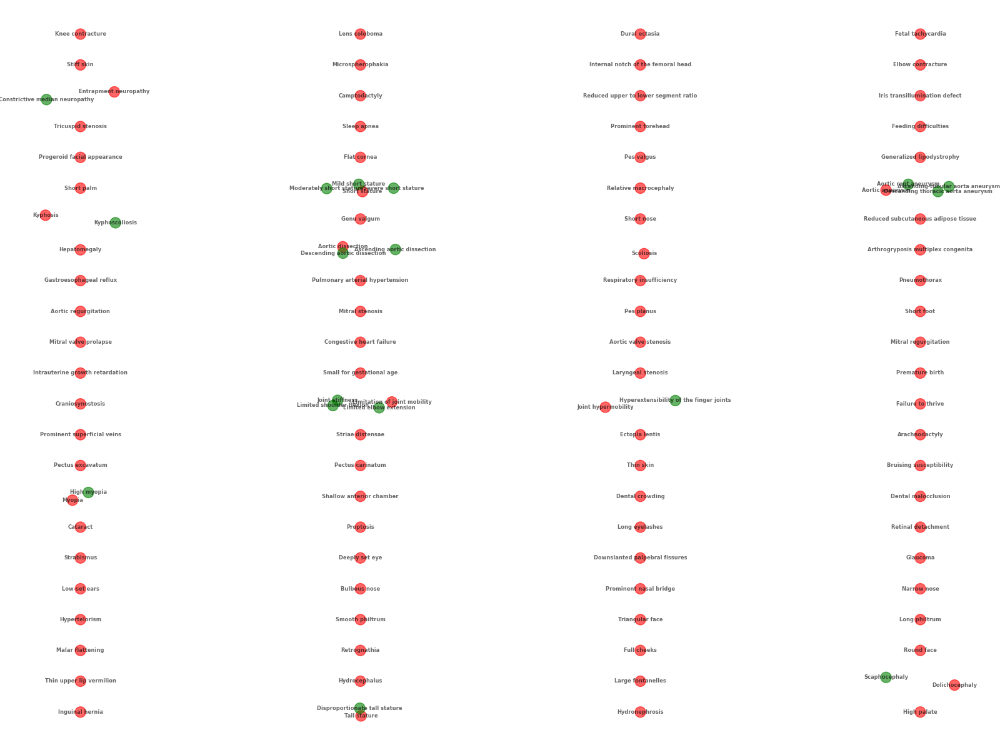

In [2]:
dataloader = CohortDataLoader.from_ppkt_store('FBN1')
data_matrix = CohortMatrixGenerator(dataloader)
hpotermclassifier = HPOTermClassifier()
hpotermclassifier.visualize_all_subtrees(data_matrix.hpo_term_observation_matrix.columns) 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_24132\2203288576.py:58: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pvalue_data_log10 = pvalue_data.applymap(lambda p: -np.log10(p) if pd.notna(p) else np.nan)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_24132\2203288576.py:58: RuntimeWarning: divide by zero encountered in log10
  pvalue_data_log10 = pvalue_data.applymap(lambda p: -np.log10(p) if pd.notna(p) else np.nan)


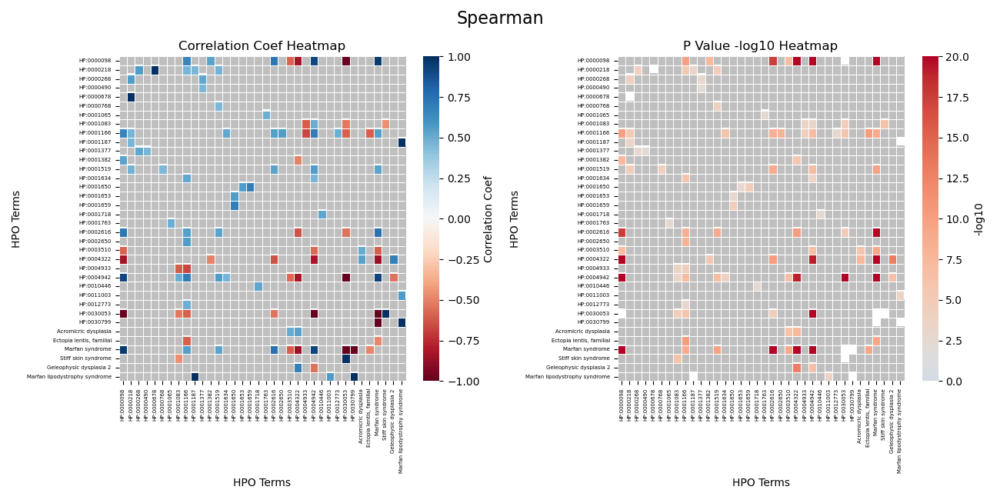

In [3]:
cohort_analyzer = CohortAnalyzer(data_matrix)
coef_matrix, p_value = cohort_analyzer.clean_matrices('Spearman')
hpo_labels =  {v: k for k, v in data_matrix.hpo_labels.items()}
coef_matrix_renamed =coef_matrix.rename(columns=hpo_labels).rename(index=hpo_labels)
p_value_renamed =p_value.rename(columns=hpo_labels).rename(index=hpo_labels)
plot_heatmaps(coef_matrix_renamed, p_value_renamed,coef_matrix,p_value)

In [4]:
hpo_matrix = matrix_preprocessing(data_matrix.hpo_term_observation_matrix)  
disease_matrix = data_matrix.disease_matrix.rename(columns=data_matrix.disease_labels)

In [ ]:
importance_dict, interaction_matrices, synergy_dict, _, _ = compute_synergy_random_forest(hpo_matrix,disease_matrix)
visualize_synergy_with_highlight(importance_dict, interaction_matrices, synergy_dict)

In [ ]:
importance_dict, interaction_matrices, synergy_dict, _, _ = compute_synergy_mutual_info(hpo_matrix,disease_matrix)
visualize_synergy_with_highlight(importance_dict, interaction_matrices, synergy_dict,title='Mutual Information')

In [35]:
%matplotlib widget
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ppkt2synergy import CohortDataLoader
from ppkt2synergy import CohortMatrixGenerator
from ppkt2synergy import CohortAnalyzer, HPOTermClassifier,SynergyAnalyzer
from sklearn.metrics import mutual_info_score
from itertools import combinations
from sklearn.utils import shuffle
from joblib import Parallel, delayed

def matrix_preprocessing(hpo_matrix, threshold=0.5, mode='leaf'):
        """
        Function to classify and extract submatrices from a given matrix based on the mode.
        
        Parameters:
        - mode: A string, either 'leaf' or 'root'. If 'leaf', extract the leaf terms; if 'root',
        extract the root terms (i.e., the entire subtree).

        Returns:
        - combined_matrix: The final matrix containing selected submatrices.
        """  
        nan_ratio = hpo_matrix.isna().mean()
    
        columns_to_drop = nan_ratio[nan_ratio > threshold].index
        
        hpo_matrix = hpo_matrix.drop(columns=columns_to_drop)
        hpotermclassifier = HPOTermClassifier()   
        subtrees = hpotermclassifier.classify_terms(hpo_matrix.columns)

        all_terms_to_extract = []

        for root, data in subtrees.items():
            leaves = data["leaves"]

            # If mode is 'root', only extract the root term(s) (root itself)
            if mode == 'root':
                all_terms_to_extract.extend([root])  
            
            # If mode is 'leaf', extract only the leaf terms or a single term if there's only one
            elif mode == 'leaf':
                all_terms_to_extract.extend(leaves)

        final_matrix = hpo_matrix[all_terms_to_extract]

        return final_matrix


def compute_mutual_info_pvalue(feature, labels, n_permutations=1000,n_jobs=-1):
    """
    Compute mutual information between a binary feature and binary labels with a permutation-based p-value.
    
    Parameters:
    - feature: 1D NumPy array or Pandas Series, binary feature (0/1).
    - labels: 1D NumPy array or Pandas Series, binary target labels (0/1).
    - n_permutations: Number of permutations for significance testing.
    
    Returns:
    - mi_score: Mutual information between feature and labels.
    - p_value: Permutation test p-value.
    """
    # Compute original mutual information (MI) between feature and labels
    mi_score = mutual_info_score(feature, labels)

    def _compute_permuted_synergy(i):
        shuffled_labels = shuffle(labels)
        mi = mutual_info_score(feature, shuffled_labels)
        return mi

    # Compute MI for permuted labels to estimate the null distribution
    permuted_mi_scores = Parallel(n_jobs=n_jobs)(
        delayed(_compute_permuted_synergy)(i) for i in range(n_permutations)
    )

    # Compute p-value: fraction of permuted MI scores greater than or equal to observed MI
    p_value = np.mean(np.array(permuted_mi_scores)>= mi_score)

    return mi_score, p_value

def compute_synergy_mutual_info(hpo_matrix, disease_matrix, n_permutations=1000, n_jobs=-1):
    hpo_matrix = hpo_matrix.fillna(0)
    disease_matrix = disease_matrix.fillna(0)

    # Initialize result dictionaries
    mi_hpo_term, mi_hpo_term_pvalue = {}, {}
    mi_hpo_pair_matrices, mi_hpo_pair_pvalue_matrices = {}, {}
    synergy_dict = {}

    # Helper function to compute mutual information for individual terms
    def compute_term_mutual_info(term, y):
        mi_mean, mi_pvalue = compute_mutual_info_pvalue(hpo_matrix[term], y, n_permutations,n_jobs)
        return term, mi_mean, mi_pvalue

    # Parallelize mutual information computation for individual terms
    for disease in disease_matrix.columns:
        y = disease_matrix[disease]
        terms = hpo_matrix.columns

        # Initialize matrices for storing results
        mi_hpo_term[disease] = {}
        mi_hpo_term_pvalue[disease] = {}
        mi_hpo_pair_matrices[disease] = pd.DataFrame(np.zeros((len(terms), len(terms))), index=terms, columns=terms)
        mi_hpo_pair_pvalue_matrices[disease] = pd.DataFrame(np.zeros((len(terms), len(terms))), index=terms, columns=terms)
        synergy_dict[disease] = {}

        # Compute mutual information for individual terms using parallelism
        term_results = Parallel(n_jobs=n_jobs)(
            delayed(compute_term_mutual_info)(term, y) for term in terms
        )
        
        for term, mi_mean, mi_pvalue in term_results:
            mi_hpo_term[disease][term] = mi_mean
            mi_hpo_term_pvalue[disease][term] = mi_pvalue

        # Helper function to compute mutual information for pairs of terms
        def compute_pair_mutual_info(term1, term2, y):
            combined_features = hpo_matrix[[term1, term2]].astype(str).agg('_'.join, axis=1)
            mi_g1g2_c_mean, mi_g1g2_c_pvalue = compute_mutual_info_pvalue(combined_features, y, n_permutations,n_jobs)
            synergy_score = mi_g1g2_c_mean - mi_hpo_term[disease][term1] - mi_hpo_term[disease][term2]
            return term1, term2, mi_g1g2_c_mean, mi_g1g2_c_pvalue, synergy_score

        # Compute mutual information for pairs of terms and synergy using parallelism
        pair_results = Parallel(n_jobs=n_jobs)(
            delayed(compute_pair_mutual_info)(term1, term2, y) for term1, term2 in combinations(terms, 2)
        )

        # Store results for pairs
        for term1, term2, mi_g1g2_c_mean, mi_g1g2_c_pvalue, synergy_score in pair_results:
            mi_hpo_pair_matrices[disease].loc[term1, term2] = mi_g1g2_c_mean
            mi_hpo_pair_pvalue_matrices[disease].loc[term1, term2] = mi_g1g2_c_pvalue
            mi_hpo_pair_pvalue_matrices[disease].loc[term2, term1] = mi_g1g2_c_pvalue
            mi_hpo_pair_matrices[disease].loc[term2, term1] = mi_g1g2_c_mean

            if synergy_score != 0 and mi_hpo_term_pvalue[disease][term1] <= 0.05 and mi_hpo_term_pvalue[disease][term2] <= 0.05 and mi_g1g2_c_pvalue <= 0.05:
                synergy_dict[disease][f"{term1}_{term2}"] = synergy_score

    return mi_hpo_term, mi_hpo_pair_matrices, synergy_dict, mi_hpo_term_pvalue, mi_hpo_pair_pvalue_matrices


def visualize_synergy_with_highlight(mutual_info_term, mutual_info_pair_matrices, synergy_dict):
    """
    Visualize the mutual information of individual HPO terms and pairwise HPO term interactions.
    Highlight synergy interactions between HPO terms for each disease.

    Parameters:
    - mutual_info_term: Dictionary with mutual information scores for individual HPO terms.
    - mutual_info_pair_matrices: Dictionary with DataFrames, storing pairwise mutual information matrices for each disease.
    - synergy_dict: Dictionary with synergy scores for HPO term pairs for each disease.
    """
    
    # Iterate over each disease and visualize its results
    for disease, mi_scores in mutual_info_term.items():
        if disease not in mutual_info_pair_matrices:
            continue  # Skip diseases that don't have interaction data
        
        # Get the pairwise mutual information matrix for the current disease
        mi_pair_matrix = mutual_info_pair_matrices[disease]
        
        # Get synergy interactions for the current disease
        synergy_scores = synergy_dict[disease]
        
        # Create a figure with two subplots: one for HPO term importance and one for interaction importance
        fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={'width_ratios': [1, 1.8]})

        
        # Left side: Bar chart of individual HPO term mutual information scores
        hpo_df = pd.DataFrame.from_dict(mi_scores, orient='index', columns=['mutual_info'])
        hpo_df = hpo_df.sort_values(by='mutual_info', ascending=False)
        top_hpo_df = hpo_df.head(20)  # Display the top 20 HPO terms based on mutual information
        
        sns.barplot(x=top_hpo_df.index, y=top_hpo_df['mutual_info'], palette="Blues_r", ax=axes[0], hue=top_hpo_df.index, legend=False)
        axes[0].set_xticks(range(len(top_hpo_df.index)))
        axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)
        axes[0].tick_params(axis='both', labelsize=8)
        axes[0].set_ylim(0, max(top_hpo_df['mutual_info']) * 1.2)
        axes[0].set_title(f"Mutual Information of HPO Terms for {disease}")
        axes[0].set_ylabel("Mutual Information")
        axes[0].set_xlabel("HPO Terms")
        
        # Add mutual information values on top of the bars
        for i, v in enumerate(top_hpo_df['mutual_info']):
            axes[0].text(i, v + max(top_hpo_df['mutual_info']) * 0.02, f"{v:.3f}", 
                        ha='center', fontsize=6, fontweight='bold', color='black')

        
        # Right side: Heatmap of pairwise mutual information between HPO terms
        sns.heatmap(mi_pair_matrix, annot=True, cmap="YlGnBu", fmt=".2f", ax=axes[1], cbar_kws={'label': 'Mutual Information'})
        axes[1].set_title(f"Pairwise Mutual Information of HPO Terms for {disease}")
        axes[1].tick_params(axis='both', labelsize=8)
        
        # Highlight synergy interactions with red boxes on the heatmap
        for interaction, score in synergy_scores.items():
            if score != 0:
                term1, term2 = interaction.split('_')
                term1_idx = mi_pair_matrix.columns.get_loc(term1)
                term2_idx = mi_pair_matrix.columns.get_loc(term2)
                
                # Add red rectangles around synergy interactions
                axes[1].add_patch(plt.Rectangle((term1_idx, term2_idx), 1, 1, fill=False, edgecolor='red', lw=2))
                axes[1].add_patch(plt.Rectangle((term2_idx, term1_idx), 1, 1, fill=False, edgecolor='red', lw=2))
        
        plt.tight_layout()
        plt.show()

In [36]:
dataloader = CohortDataLoader.from_ppkt_store('FBN1')
data_matrix = CohortMatrixGenerator(dataloader) 
cohort_analyzer = CohortAnalyzer(data_matrix)
coef_matrix, p_value = cohort_analyzer.clean_matrices('Spearman')
hpo_matrix = matrix_preprocessing(data_matrix.hpo_term_observation_matrix,mode="root",threshold=0.5).rename(columns=data_matrix.hpo_labels).join(data_matrix.sex_matrix)  
disease_matrix = data_matrix.disease_matrix.rename(columns=data_matrix.disease_labels)
mi_hpo_term, mi_hpo_pair_matrices, synergy_dict, mi_hpo_term_pvalue, mi_hpo_pair_pvalue_matrices = compute_synergy_mutual_info(hpo_matrix,disease_matrix,n_jobs=16)

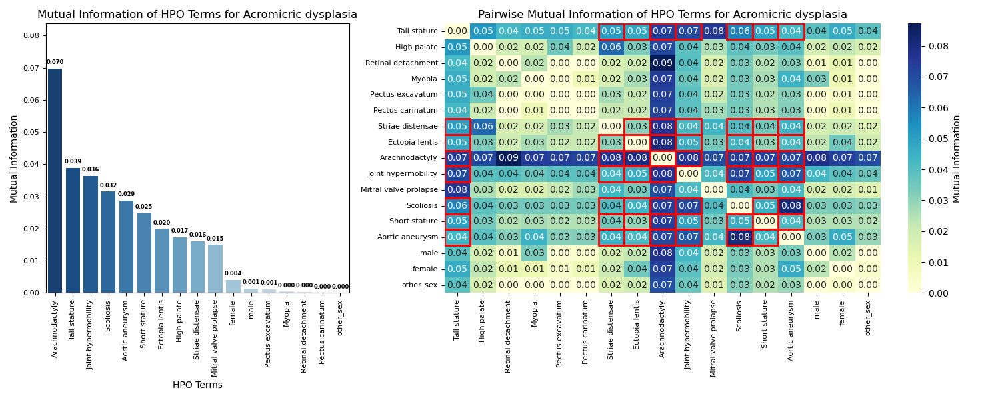

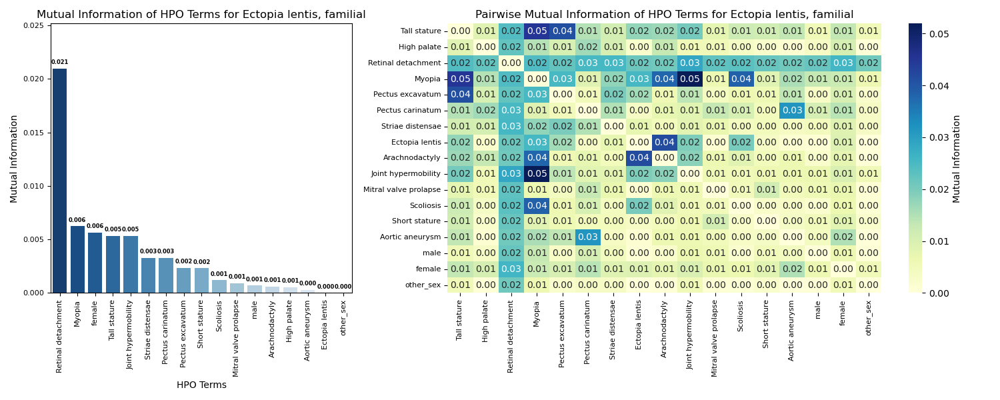

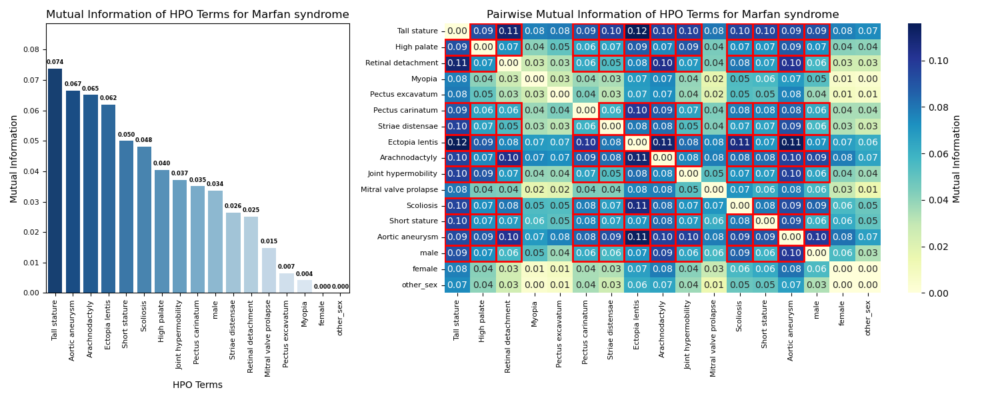

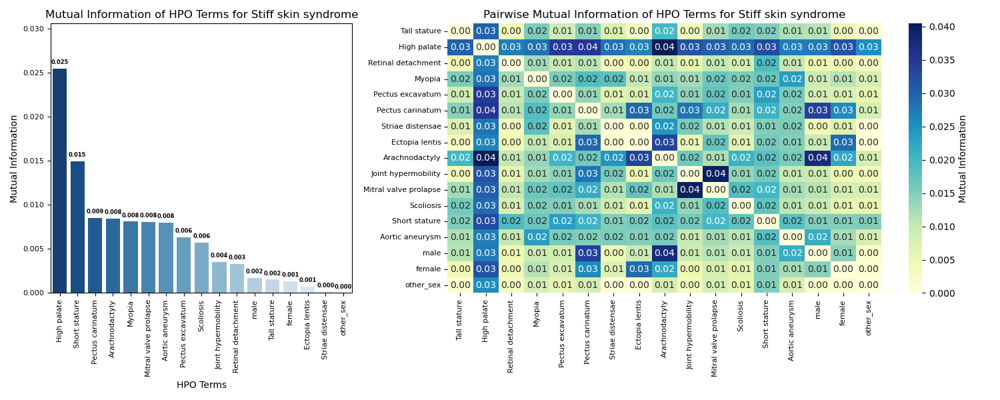

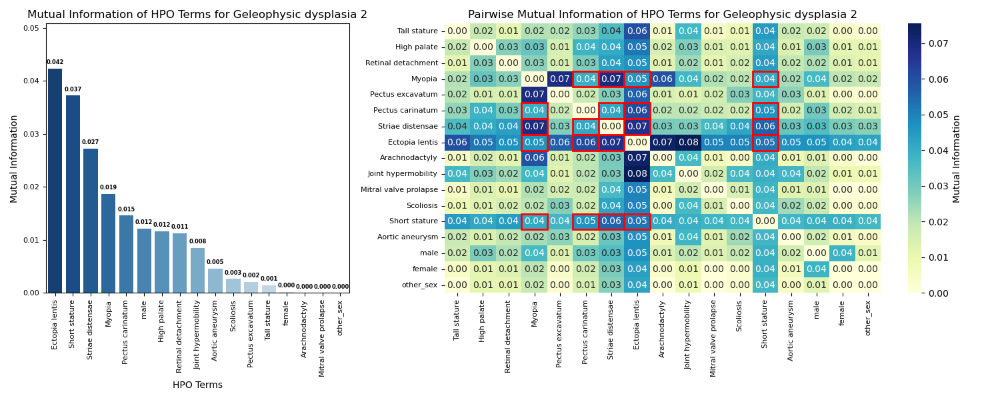

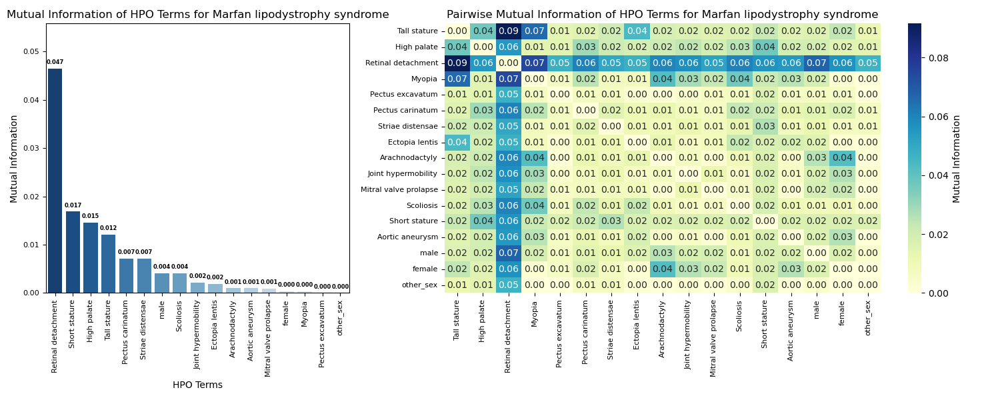

In [37]:
visualize_synergy_with_highlight(mi_hpo_term, mi_hpo_pair_matrices, synergy_dict)

In [42]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ppkt2synergy import CohortDataLoader
from ppkt2synergy import CohortMatrixGenerator
from ppkt2synergy import CohortAnalyzer, HPOTermClassifier,SynergyAnalyzer
from sklearn.metrics import mutual_info_score
from itertools import combinations
from sklearn.utils import shuffle
from joblib import Parallel, delayed
from matplotlib.patches import Rectangle
from statsmodels.stats.multitest import multipletests
from sklearn.utils import resample

def matrix_preprocessing(hpo_matrix, threshold=0.5, mode='leaf'):
    """
    Function to classify and extract submatrices from a given matrix based on the mode.

    Parameters:
    - hpo_matrix: A pandas DataFrame containing HPO term data.
    - threshold: A float value (default: 0.5), which determines the maximum allowed 
                 NaN ratio for a column to be retained.
    - mode: A string, either 'leaf' or 'root'. If 'leaf', extract the leaf terms; 
            if 'root', extract the root terms (i.e., the entire subtree).

    Returns:
    - final_matrix: The final matrix containing selected submatrices.
    """    
    nan_ratio = hpo_matrix.isna().mean()
    
    columns_to_drop = nan_ratio[nan_ratio > threshold].index
        
    hpo_matrix = hpo_matrix.drop(columns=columns_to_drop)
    hpotermclassifier = HPOTermClassifier()   
    subtrees = hpotermclassifier.classify_terms(hpo_matrix.columns)

    all_terms_to_extract = []

    for root, data in subtrees.items():
        leaves = data["leaves"]

        # If mode is 'root', only extract the root term(s) (root itself)
        if mode == 'root':
            all_terms_to_extract.extend([root])  
            
        # If mode is 'leaf', extract only the leaf terms or a single term if there's only one
        elif mode == 'leaf':
            all_terms_to_extract.extend(leaves)

    final_matrix = hpo_matrix[list(set(all_terms_to_extract))]

    return final_matrix    


def compute_synergy(feature1, feature2, labels):
    """
    Compute the synergy score between two features.

    Parameters:
    - feature1, feature2: Pandas Series representing two features.
    - labels: Target variable (classification labels).

    Returns:
    - synergy score computed as mutual information difference.
    """
    # Concatenate two features as a combined feature representation
    combined = feature1.astype(str) + "_" + feature2.astype(str)
    # Compute mutual information scores
    mi_combined = mutual_info_score(combined, labels)
    mi1 = mutual_info_score(feature1, labels)
    mi2 = mutual_info_score(feature2, labels)
    return mi_combined - mi1 - mi2


def permutation_test_synergy(feature1,feature2, labels, n_permutations=1000, n_jobs=-1):
    """
    Perform permutation test for synergy significance.

    Parameters:
    - feature1, feature2: Pandas Series representing two features.
    - labels: Target labels.
    - n_permutations: Number of permutations (default: 1000).
    - n_jobs: Number of parallel jobs (-1 uses all available cores).

    Returns:
    - synergy score and p-value.
    """
    # Compute original MI
    synergy_score = compute_synergy(feature1,feature2,labels)
    print(synergy_score)
    # Function for parallel computation
    def _compute_permuted_synergy(i):
        labels_shuffled = shuffle(labels)
        return compute_synergy(feature1, feature2,labels_shuffled)

    # Parallelize the computation
    permuted_synergy_scores = Parallel(n_jobs=n_jobs)(
        delayed(_compute_permuted_synergy)(i) for i in range(n_permutations)
    )
    # Compute p-value
    p_value = np.mean(np.array(permuted_synergy_scores) >= synergy_score)
    return synergy_score, p_value

def bootstrap_synergy(feature1, feature2, labels, n_bootstrap=1000,n_jobs=-1):
    """
    Estimate synergy score distribution using bootstrap resampling.

    Parameters:
    - feature1, feature2: Pandas Series representing two features.
    - labels: Target labels.
    - n_bootstrap: Number of bootstrap samples (default: 1000).
    - n_jobs: Number of parallel jobs.

    Returns:
    - A list of bootstrap synergy scores.
    """
    synergy_scores = []
    n = len(labels)
    def _compute_bootstrap_synergy(i):
        idx = resample(np.arange(n), replace=True)
        f1_bs = feature1.iloc[idx]
        f2_bs = feature2.iloc[idx]
        labels_bs = labels.iloc[idx]
        return compute_synergy(f1_bs, f2_bs, labels_bs)
    
    synergy_scores = Parallel(n_jobs=n_jobs)(
        delayed(_compute_bootstrap_synergy)(i) for i in range(n_bootstrap)
    )

    return synergy_scores



def compute_synergy_mutual_info(feature_matrix, target_matrix, n_bootstrap=1000,n_permutations=1000, n_jobs=-1, alpha=0.05, method='fdr_tsbh'):
    """
    Compute synergy scores between feature pairs using mutual information.
    
    Parameters:
    - feature_matrix: DataFrame, binary feature matrix where columns are HPO terms.
    - target_matrix: DataFrame, binary target matrix where columns are disease labels.
    - n_bootstrap: int, number of bootstrap samples for synergy estimation.
    - n_permutations: int, number of permutations for statistical significance testing.
    - n_jobs: int, number of parallel jobs (-1 uses all available cores).
    - alpha: float, significance level for multiple testing correction.
    - method: str, method for p-value correction (e.g., 'fdr_tsbh').
    
    Returns:
    - synergy_matrices: Dictionary of synergy scores for each target.
    - synergy_pvalue_matrices: Dictionary of p-value matrices.
    - synergy_significant_dicts: Dictionary of significant synergy pairs.
    - synergy_bootstrap_dicts: Dictionary of bootstrap synergy distributions.
    """
    # Fill missing values
    feature_matrix = feature_matrix.fillna(0)
    target_matrix = target_matrix.fillna(0)
    n =len(feature_matrix.columns)
    terms = feature_matrix.columns
    
    # Initialize result dictionarie
    synergy_matrices = {}
    synergy_pvalue_matrices = {}
    synergy_significant_dicts = {}
    synergy_bootstrap_dicts = {}
    
    # Iterate over each target
    for target in target_matrix.columns:
        y = target_matrix[target]
        
        # Initialize dictionaries for the current target
        synergy_matrices[target] = pd.DataFrame(
            np.zeros((n, n)),
            index = terms, columns=terms)
        
        synergy_pvalue_matrices[target] = pd.DataFrame(
            np.zeros((n, n)),
            index=terms, columns=terms)
        
        synergy_significant_dicts[target] = {}
        synergy_bootstrap_dicts[target]={}
        
        # Parallelize computation for pairs of terms
        def _process_pair(term1, term2):
            feature1 = feature_matrix[term1]
            feature2 = feature_matrix[term2]
            synergy_score, synergy_pvalue = permutation_test_synergy(feature1,feature2, y, n_permutations, n_jobs)
            return term1, term2, synergy_score, synergy_pvalue
        
        pair_results = Parallel(n_jobs=n_jobs)(
            delayed(_process_pair)(term1, term2) for term1, term2 in combinations(terms, 2)
        )
       
        for term1, term2, synergy_score, synergy_pvalue in pair_results:
            synergy_matrices[target].loc[term1, term2] = synergy_matrices[target].loc[term2, term1] =synergy_score
            synergy_pvalue_matrices[target].loc[term1, term2] = synergy_pvalue_matrices[target].loc[term2, term1] =synergy_pvalue
            
        pvals = [synergy_pvalue_matrices[target].iloc[i,j] for i, j in combinations(range(n), 2)]
        _, corrected_pvals, *_ = multipletests(pvals, alpha=alpha, method=method)
        
        # 更新校正后p值并记录显著对
        for (i,j), p_corrected in zip(combinations(range(n), 2), corrected_pvals):
            term1, term2 = terms[i], terms[j]
            synergy_pvalue_matrices[target].iloc[i,j] = synergy_pvalue_matrices[target].iloc[j,i] = p_corrected
            
            if p_corrected <= alpha and synergy_matrices[target].iloc[i,j]>0:
                key = f"{term1}_{term2}"
                synergy_significant_dicts[target][key] = synergy_matrices[target].iloc[i,j]
                synergy_bootstrap= bootstrap_synergy(feature_matrix[term1],feature_matrix[term2],y,n_bootstrap,n_jobs)
                synergy_bootstrap_dicts[target][key] = synergy_bootstrap

        
    return synergy_matrices, synergy_pvalue_matrices, synergy_significant_dicts, synergy_bootstrap_dicts


def visualize_synergy_heatmap(synergy_matrices, synergy_significant, synergy_bootstrap_dicts, figsize=(15, 8)):
    """
    Visualize synergy scores as heatmaps and error bar plots.
    
    Parameters:
    - synergy_matrices: Dictionary of synergy score matrices.
    - synergy_significant: Dictionary of significant synergy pairs.
    - synergy_bootstrap_dicts: Dictionary of bootstrap synergy distributions.
    - figsize: Tuple, figure size.
    """
    for target in synergy_matrices:
        synergy_matrix = synergy_matrices.get(target, pd.DataFrame)
        significant_pairs = synergy_significant.get(target, {})
        bootstrap_dict = synergy_bootstrap_dicts.get(target, {})
        
        fig, axes = plt.subplots(1, 2, figsize=figsize, gridspec_kw={'width_ratios': [3, 1]})
        
        # 左侧绘制 Synergy Heatmap
        ax1 = axes[0]
        sns.heatmap(
            synergy_matrix, 
            annot=True, 
            cmap="YlGnBu", 
            fmt=".3f", 
            cbar_kws={'label': 'Synergy Score'},
            linewidths=0.5,
            linecolor='lightgray',
            ax=ax1,
            annot_kws={'size': 8}
        )
        ax1.set_title(f"Synergy Scores with Significant P Value - {target}")
        ax1.tick_params(axis='both', labelsize=8)
        
        # 添加红色方框标记显著协同性互作
        for pair in significant_pairs:
            term1, term2 = pair.split('_')
            term1_idx = list(synergy_matrix.columns).index(term1)
            term2_idx = list(synergy_matrix.columns).index(term2)
            
            # 在 (term1, term2) 和 (term2, term1) 位置添加红色方框
            rect_params = {'fill': False, 'edgecolor': 'red', 'lw': 2}
            ax1.add_patch(Rectangle((term1_idx, term2_idx), 1, 1, **rect_params))
            ax1.add_patch(Rectangle((term2_idx, term1_idx), 1, 1, **rect_params))
        
        # 右侧绘制 Error Bar Plot
        ax2 = axes[1]
        bootstrap_means = []
        ci_lower = []
        ci_upper = []
        labels = []
        
        for pair in significant_pairs:
            if pair in bootstrap_dict:
                bootstrap_samples = np.array(bootstrap_dict[pair])
                bootstrap_means.append(np.mean(bootstrap_samples))
                ci_lower.append(np.percentile(bootstrap_samples,2.5))
                ci_upper.append(np.percentile(bootstrap_samples,97.5))
                labels.append(pair)
        
        # 绘制误差条图
        ax2.errorbar(bootstrap_means, range(len(labels)), 
                    xerr=[np.array(bootstrap_means) - np.array(ci_lower), np.array(ci_upper) - np.array(bootstrap_means)], 
                    fmt='o', capsize=5, color='orange', markerfacecolor='black')
        ax2.set_yticks(range(len(labels)))
        ax2.set_yticklabels(labels, fontsize=8)
        ax2.set_xlabel("Synergy Score (95% CI)")
        ax2.set_title("95% CI Error Bars for Bootstrap Synergy Estimation")
        ax2.grid(axis='x', linestyle='--', alpha=0.7)
        
        plt.tight_layout()
        plt.show()

In [ ]:
dataloader = CohortDataLoader.from_ppkt_store('FBN1')
data_matrix = CohortMatrixGenerator(dataloader)
hpo_matrix = matrix_preprocessing(data_matrix.hpo_term_observation_matrix,mode="leaf",threshold=0.5).rename(columns=data_matrix.hpo_labels).join(data_matrix.sex_matrix)  
disease_matrix = data_matrix.disease_matrix.rename(columns=data_matrix.disease_labels)
synergy_matrices,synergy_pvalue_matrices, synergy_significant, synergy_bootstrap_dicts = compute_synergy_mutual_info(hpo_matrix,disease_matrix,n_jobs=16)


D:\storage\Master_Thesis\ppkt2synergy\src\ppkt2synergy\cohort_analyzer.py:190: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


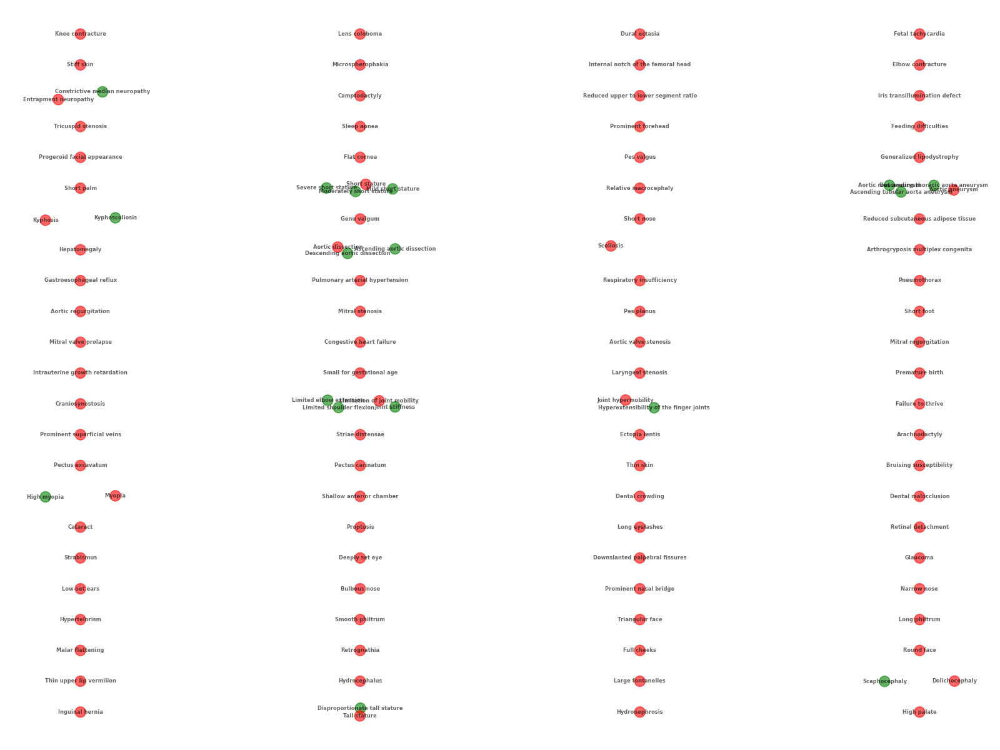

In [72]:
dataloader = CohortDataLoader.from_ppkt_store('FBN1')
data_matrix = CohortMatrixGenerator(dataloader)
hpotermclassifier = HPOTermClassifier()
hpotermclassifier.visualize_all_subtrees(data_matrix.hpo_term_observation_matrix.columns) 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_19172\2203288576.py:58: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pvalue_data_log10 = pvalue_data.applymap(lambda p: -np.log10(p) if pd.notna(p) else np.nan)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_19172\2203288576.py:58: RuntimeWarning: divide by zero encountered in log10
  pvalue_data_log10 = pvalue_data.applymap(lambda p: -np.log10(p) if pd.notna(p) else np.nan)


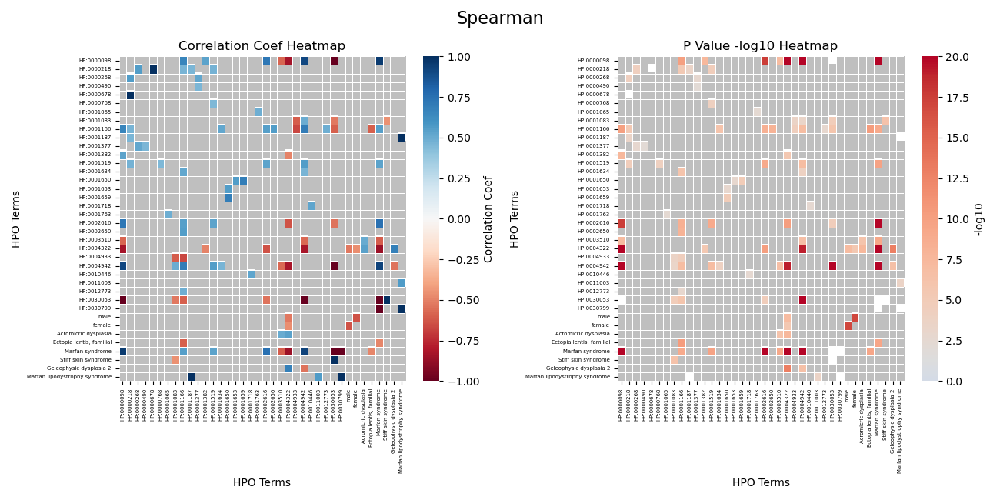

In [73]:
cohort_analyzer = CohortAnalyzer(data_matrix)
coef_matrix, p_value = cohort_analyzer.clean_matrices('Spearman')
hpo_labels =  {v: k for k, v in data_matrix.hpo_labels.items()}
coef_matrix_renamed =coef_matrix.rename(columns=hpo_labels).rename(index=hpo_labels)
p_value_renamed =p_value.rename(columns=hpo_labels).rename(index=hpo_labels)
plot_heatmaps(coef_matrix_renamed, p_value_renamed,coef_matrix,p_value)

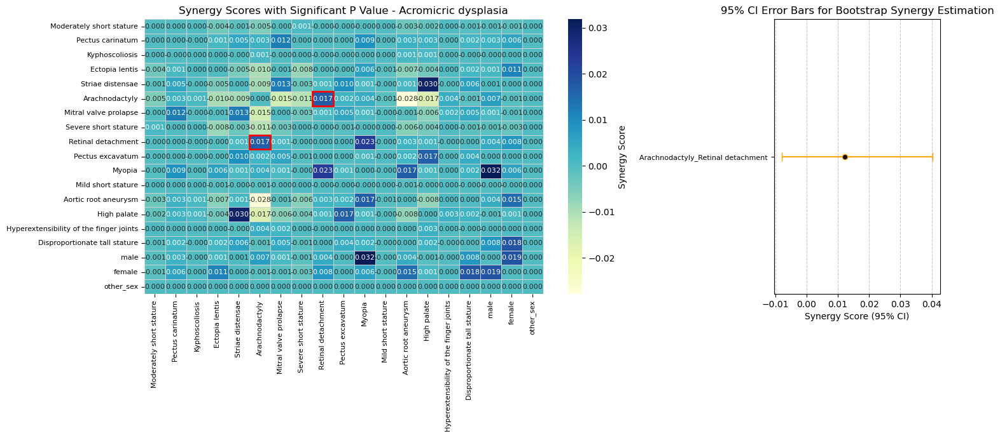

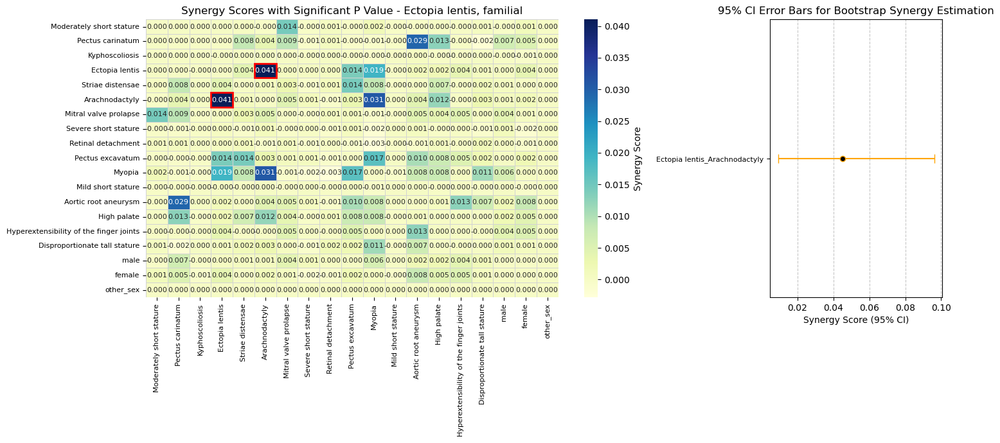

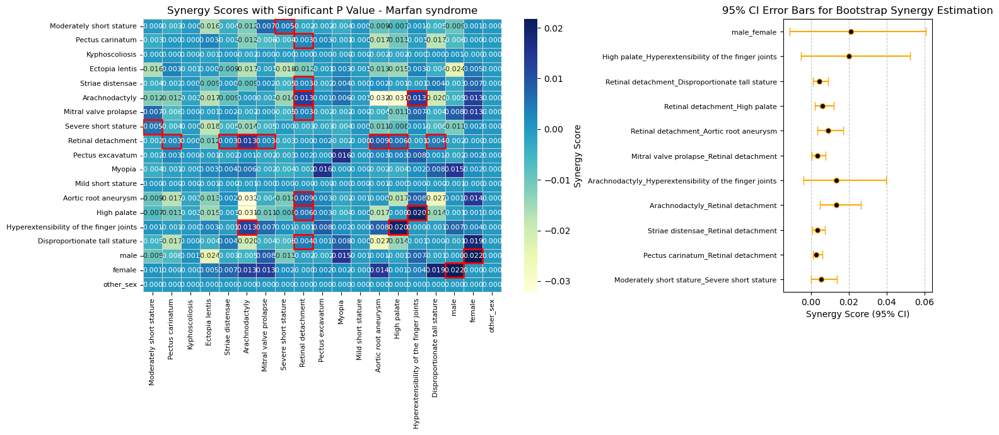

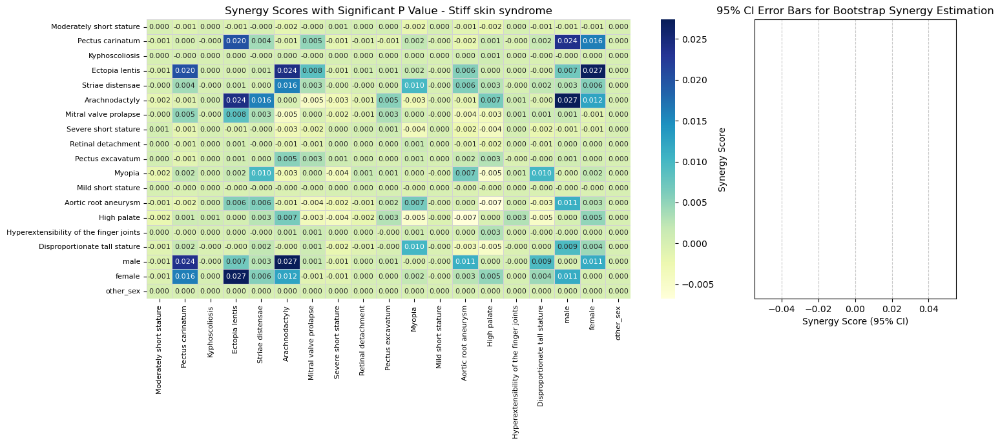

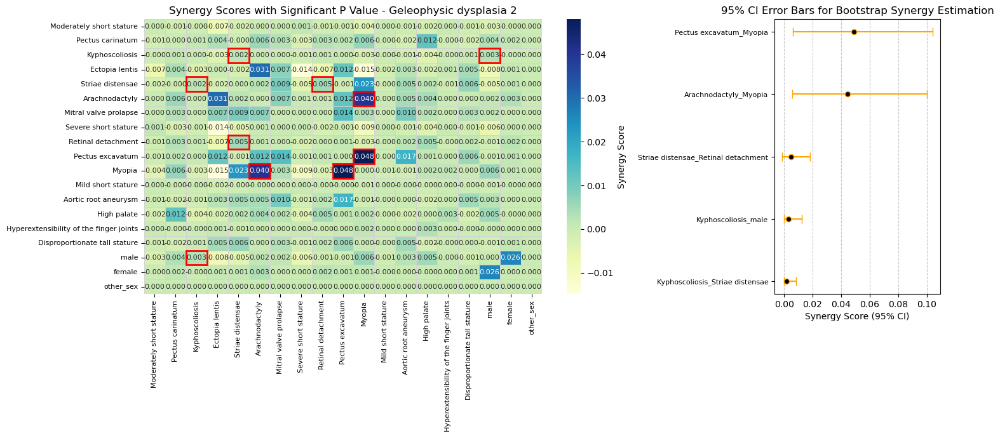

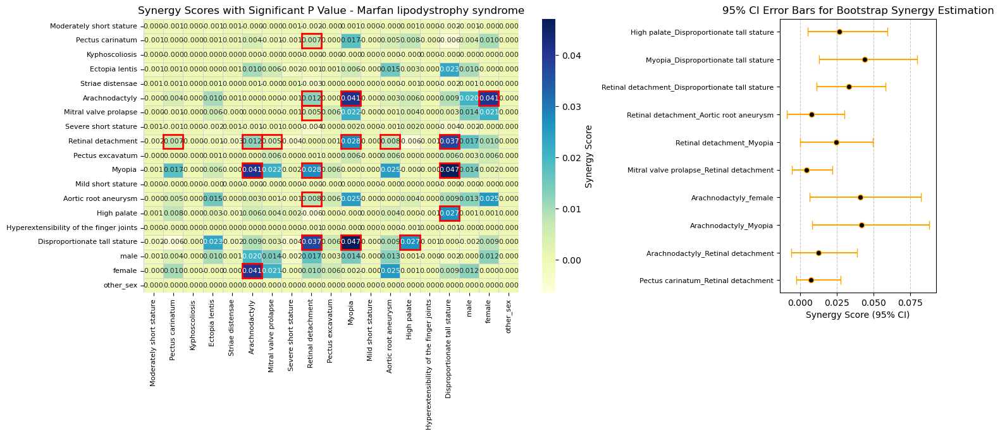

In [6]:
visualize_synergy_heatmap(
    synergy_matrices,
    synergy_significant,
    synergy_bootstrap_dicts,
    figsize=(15, 7) 
)

In [43]:
dataloader = CohortDataLoader.from_ppkt_store('CHD8')
data_matrix = CohortMatrixGenerator(dataloader)
hpo_matrix = matrix_preprocessing(data_matrix.hpo_term_observation_matrix,mode="leaf",threshold=0.5).rename(columns=data_matrix.hpo_labels).join(data_matrix.sex_matrix)  
disease_matrix = data_matrix.disease_matrix.rename(columns=data_matrix.disease_labels)
synergy_matrices,synergy_pvalue_matrices, synergy_significant, synergy_bootstrap_dicts = compute_synergy_mutual_info(hpo_matrix,disease_matrix,n_jobs=16)

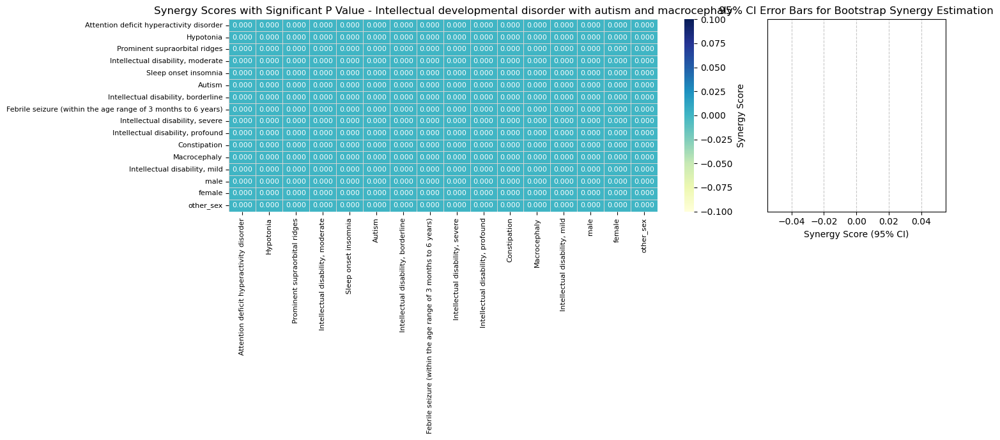

In [47]:
visualize_synergy_heatmap(
    synergy_matrices,
    synergy_significant,
    synergy_bootstrap_dicts,
    figsize=(15, 7) 
)

In [46]:
disease_matrix.iloc[:,0].eq(1).all()

True

In [52]:
import numpy as np
import pandas as pd
from itertools import combinations
from functools import lru_cache
from typing import Dict, List, Tuple, Optional
from sklearn.metrics import mutual_info_score
from graphviz import Digraph
from abc import ABCMeta, abstractmethod

# ------------------------------
# Module 1: Tree Node Classes
# ------------------------------

class TreeNode(metaclass=ABCMeta):
    """Abstract base class for all tree nodes"""
    @property
    @abstractmethod
    def features(self) -> Tuple[int]:
        pass

    @property
    @abstractmethod
    def mi(self) -> float:
        pass

    @abstractmethod
    def is_leaf(self) -> bool:
        pass

class LeafNode(TreeNode):
    def __init__(self, features: Tuple[int], mi: float, label: str):
        self._features = features
        self._mi = mi
        self.label = label

    @property
    def features(self) -> Tuple[int]:
        return self._features

    @property
    def mi(self) -> float:
        return self._mi

    def is_leaf(self) -> bool:
        return True

class InternalNode(TreeNode):
    def __init__(self, features: Tuple[int], mi: float, synergy: float, children: List[TreeNode]):
        self._features = features
        self._mi = mi
        self.synergy = synergy
        self.children = children

    @property
    def features(self) -> Tuple[int]:
        return self._features

    @property
    def mi(self) -> float:
        return self._mi

    def is_leaf(self) -> bool:
        return False

# ------------------------------
# Module 2: Mutual Information Calculation
# ------------------------------
class MutualInformationCalculator:
    def __init__(self, feature_matrix: np.ndarray, target: np.ndarray):
        self.feature_matrix = feature_matrix
        self.target = target
        self._validate_input()

    def _validate_input(self):
        if not (np.all(np.isin(self.feature_matrix, [0, 1])) and np.all(np.isin(self.target, [0, 1]))):
            raise ValueError("Features and target must contain only 0s and 1s")

    @lru_cache(maxsize=None)
    def compute_mi(self, feature_indices: Tuple[int]) -> float:
        joint_state = self.feature_matrix[:, list(feature_indices)]
        state_str = np.apply_along_axis(lambda x: ''.join(x.astype(str)), 1, joint_state)
        return mutual_info_score(state_str, self.target)

# ------------------------------
# Module 3: Synergy Tree Construction
# ------------------------------
class SynergyTreeBuilder:
    def __init__(self, X: pd.DataFrame, y: pd.Series, max_k: Optional[int] = None):
        self.feature_names = X.columns.tolist()
        self.mi_calculator = MutualInformationCalculator(X.values.astype(int), y.values.astype(int))
        self.nodes: Dict[Tuple[int], TreeNode] = {}
        self.roots: Dict[Tuple[int], TreeNode] = {}
        self.max_k = min(max_k, X.shape[1])

    def build(self) -> List[TreeNode]:
        self._init_leaf_nodes()
        for k in range(2, self.max_k + 1):
            self._build_layer(k)
        return list(self.roots.values())

    def _init_leaf_nodes(self):
        for i in range(self.mi_calculator.feature_matrix.shape[1]):
            features = (i,)
            mi = self.mi_calculator.compute_mi(features)
            self.nodes[features] = LeafNode(features, mi, self.feature_names[i])

    def _build_layer(self, k: int):
        new_nodes = {}
        all_features = list(range(self.mi_calculator.feature_matrix.shape[1]))

        for feature_comb in combinations(all_features, k):
            features = tuple(sorted(feature_comb))
            if features in self.nodes:
                continue

            joint_mi = self.mi_calculator.compute_mi(features)
            best_partition = self._find_max_partition(list(features))
            if not best_partition:
                continue

            synergy = joint_mi - sum(self.nodes[tuple(sorted(child_features))].mi for child_features in best_partition)
            if synergy <= 0:
                continue

            children = [self.nodes[tuple(sorted(child_features))] for child_features in best_partition]
            new_node = InternalNode(features, joint_mi, synergy, children)
            new_nodes[features] = new_node
            self.roots[features] = new_node

        self.nodes.update(new_nodes)

    def _find_max_partition(self, features: List[int]) -> Optional[List[Tuple[int]]]:
        all_partitions = [list(combinations(features, r)) for r in range(1, len(features))]
        best_partition = None
        max_sum = -np.inf

        for partition in all_partitions:
            partition = [tuple(sorted(p)) for p in partition]
            if not all(p in self.nodes for p in partition):
                continue

            current_sum = sum(self.nodes[p].mi for p in partition)
            if current_sum > max_sum:
                max_sum = current_sum
                best_partition = partition

        return best_partition

# ------------------------------
# Module 4: Synergy Tree Visualization
# ------------------------------
class SynergyTreeVisualizer:
    def __init__(self, root_nodes: List[TreeNode]):
        self.root_nodes = root_nodes
        self.dot = Digraph(format="svg",
                           graph_attr={"size": "10", "ranksep": "1.5", "nodesep": "0.8"})

    def visualize(self, filename="synergy_tree"):
        for root in self.root_nodes:
            self._add_node(root)
        self.dot.render(filename, view=True)

    def _add_node(self, node: TreeNode, parent_id=None):
        node_id = "-".join(map(str, node.features))

        if isinstance(node, LeafNode):
            label = f"Leaf: {node.features}\nMI: {node.mi:.4f}\nLabel: {node.label}"  # 叶子节点显示 label
            shape = "box"
        else:
            label = f"Internal: {node.features}\nMI: {node.mi:.4f}\nSynergy: {node.synergy:.4f}"
            shape = "ellipse"

        self.dot.node(node_id, label, shape=shape)

        if parent_id:
            self.dot.edge(parent_id, node_id)

        if isinstance(node, InternalNode):
            for child in node.children:
                self._add_node(child, node_id)


In [ ]:
import numpy as np
import pandas as pd
from itertools import combinations
from functools import lru_cache
from typing import Dict, List, Tuple, Optional, Protocol
from sklearn.metrics import mutual_info_score
from graphviz import Digraph

# ------------------------------
# Module 1: Interface Definitions and Node Classes
# ------------------------------
class TreeNode(metaclass=ABCMeta):
    """Abstract base class for all tree nodes"""
    @property
    @abstractmethod
    def features(self) -> Tuple[int]:
        pass

    @property
    @abstractmethod
    def mi(self) -> float:
        pass

    @abstractmethod
    def is_leaf(self) -> bool:
        pass

class LeafNode(TreeNode):
    def __init__(self, features: Tuple[int], mi: float, label: str):
        self._features = features
        self._mi = mi
        self.label = label

    @property
    def features(self) -> Tuple[int]:
        return self._features

    @property
    def mi(self) -> float:
        return self._mi

    def is_leaf(self) -> bool:
        return True

class InternalNode(TreeNode):
    def __init__(self, features: Tuple[int], mi: float, synergy: float, children: List[TreeNode]):
        self._features = features
        self._mi = mi
        self.synergy = synergy
        self.children = children

    @property
    def features(self) -> Tuple[int]:
        return self._features

    @property
    def mi(self) -> float:
        return self._mi

    def is_leaf(self) -> bool:
        return False

# ------------------------------
# Module 2: Core Calculation Components
# ------------------------------
from functools import lru_cache
import numpy as np
from sklearn.metrics import mutual_info_score
from typing import Tuple

class MutualInformationCalculator:
    """Handles mutual information calculation with caching"""
    
    def __init__(self, feature_matrix: np.ndarray, target: np.ndarray):
        self.feature_matrix = feature_matrix
        self.target = target
        self._validate_input()

    def _validate_input(self):
        """Ensure binary input matrices and target validity"""
        # Ensure the features and target are binary
        if not (np.all(np.isin(self.feature_matrix, [0, 1])) and 
                np.all(np.isin(self.target, [0, 1]))):
            raise ValueError("Features and target must contain only 0s and 1s")
        
        # Ensure target is not all zeros or all ones
        if np.all(self.target == 0) or np.all(self.target == 1):
            raise ValueError("Target cannot be all 0s or all 1s")
        
        # Ensure the feature matrix and target array have the same length
        if self.feature_matrix.shape[0] != self.target.shape[0]:
            raise ValueError("The number of rows in feature_matrix must be equal to the length of target")

    @lru_cache(maxsize=None)
    def compute_mi(self, feature_indices: Tuple[int]) -> float:
        """Calculate mutual information for feature combination"""
        # Ensure feature indices are valid
        if not all(0 <= idx < self.feature_matrix.shape[1] for idx in feature_indices):
            raise ValueError("Feature indices must be within the valid range of the feature matrix columns")

        joint_state = self.feature_matrix[:, list(feature_indices)]
        state_str = np.apply_along_axis(lambda x: ''.join(x.astype(str)), 1, joint_state)
        return mutual_info_score(state_str, self.target)


class PartitionGenerator:
    """Generates and evaluates feature partitions"""
    def __init__(self, nodes: Dict[Tuple[int], TreeNode]):
        """
        :param nodes: Current node cache for validity checking
        """
        self.nodes = nodes

    def generate_partitions(self, feature_indices):
        """Generate all possible partitions of feature_indices into subsets"""
        feature_list = list(feature_indices)
        n = len(feature_list)

        if n < 2:
            return []

        all_partitions = []

        # Ensure that every partition is unique by using a set
        seen_partitions = set()

        # Start by adding the partition where each element is its own subset
        all_partitions.append([tuple([x]) for x in feature_list])

        # Loop through possible subset sizes from 1 to n-1 (to ensure 2 non-empty subsets)
        for k in range(1, n):
            for subset in combinations(feature_list, k):
                remaining = tuple(sorted(set(feature_list) - set(subset)))  # The rest of the elements
                partition = tuple(sorted([tuple(sorted(subset)), remaining]))  # Ensure order within the partition
                if partition not in seen_partitions:
                    seen_partitions.add(partition)
                    all_partitions.append([tuple(sorted(subset)), remaining])

        return all_partitions

    def find_max_partition(self, features: List[int]) -> Optional[List[TreeNode]]:
        """Find the optimal valid partition with maximum MI sum"""
        all_partitions = self.generate_partitions(features)
        best_partition = None
        max_sum = -np.inf

        for partition in all_partitions:
            # Validate partition components
            if not all(tuple(sorted(subset)) in self.nodes for subset in partition):
                continue

            # Calculate partition score
            current_sum = sum(self.nodes[tuple(sorted(subset))].mi for subset in partition)
            if current_sum > max_sum:
                max_sum = current_sum
                best_partition = [self.nodes[tuple(sorted(subset))] for subset in partition]

        return best_partition

# ------------------------------
# Module 3: Synergy Tree Construction
# ------------------------------
class SynergyTreeBuilder:
    """Main class for building synergy trees from data"""
    def __init__(self, X: pd.DataFrame, y: pd.Series, max_k: Optional[int] = None):
        """
        :param X: Feature matrix (DataFrame with column names)
        :param y: Target variable (binary Series)
        :param max_k: Maximum feature combination order to build
        """
        if not isinstance(X, pd.DataFrame) or not isinstance(y, pd.Series):
            raise TypeError("Inputs must be pandas DataFrame and Series")

        self.feature_names = X.columns.tolist()
        self.mi_calculator = MutualInformationCalculator(X.values.astype(int), 
                                             y.values.astype(int))
        self.nodes: Dict[Tuple[int], TreeNode] = {}
        self.roots: Dict[Tuple[int], TreeNode] = {}
        self.max_k = max_k or X.shape[1]
        self.partition_gen = PartitionGenerator(self.nodes)  # Inject node cache

    def build(self) -> List[TreeNode]:
        """Construct synergy trees and return root nodes"""
        self._init_leaf_nodes()
        for k in range(2, self.max_k + 1):
            self._build_layer(k)
        return list(self.roots.values())

    def _init_leaf_nodes(self):
        """Initialize leaf nodes from DataFrame columns"""
        for i in range(self.mi_calculator.feature_matrix.shape[1]):
            features = (i,)
            mi = self.mi_calculator.compute_mi(features)
            self.nodes[features] = LeafNode(features, mi, self.feature_names[i])

    def _build_layer(self, k: int):
        """Build nodes for feature combinations of order k"""
        new_nodes = {}
        all_features = list(range(self.mi_calculator.feature_matrix.shape[1]))

        for feature_comb in combinations(all_features, k):
            features = tuple(sorted(feature_comb))
            if features in self.nodes:
                continue
            # Calculate node properties
            joint_mi = self.mi_calculator.compute_mi(features)
            best_partition = self.partition_gen.find_max_partition(list(features))
            if not best_partition:
                continue

            synergy = joint_mi - sum(child.mi for child in best_partition)
            if synergy <= 0:
                continue

            # Create new node and update structure
            children =  best_partition
            new_node = InternalNode(features, joint_mi, synergy, children)
            new_nodes[features] = new_node
            self._update_roots(new_node, children)

        self.nodes.update(new_nodes)

    
    def _update_roots(self, new_node: InternalNode, children: List[TreeNode]):
        """Maintain root node integrity"""
        for child in children:
            if child.features in self.roots:
                del self.roots[child.features]
        self.roots[new_node.features] = new_node

# ------------------------------
# Module 4: Synergy Tree Visualization
# ------------------------------
class SynergyTreeVisualizer:
    def __init__(self, root_nodes: List[TreeNode]):
        self.root_nodes = root_nodes
        self.dot = Digraph(format="svg",
                           graph_attr={"size": "10", "ranksep": "1.5", "nodesep": "0.8"})

    def visualize(self, filename="synergy_tree"):
        for root in self.root_nodes:
            self._add_node(root)
        self.dot.render(filename, view=True)

    def _add_node(self, node: TreeNode, parent_id=None):
        node_id = "-".join(map(str, node.features))

        if isinstance(node, LeafNode):
            label = f"Leaf: {node.features}\nMI: {node.mi:.6f}\nLabel: {node.label}"  # 叶子节点显示 label
            shape = "box"
        else:
            label = f"Internal: {node.features}\nMI: {node.mi:.6f}\nSynergy: {node.synergy:.6f}"
            shape = "ellipse"

        self.dot.node(node_id, label, shape=shape)

        if parent_id:
            self.dot.edge(parent_id, node_id)

        if isinstance(node, InternalNode):
            for child in node.children:
                self._add_node(child, node_id)

NameError: name 'ABCMeta' is not defined

In [5]:
from ppkt2synergy import CohortDataLoader
from ppkt2synergy import CohortMatrixGenerator
from ppkt2synergy import CohortDataProcessor
from ppkt2synergy import SynergyTreeBuilder

# ------------------------------
# Usage Example
# ------------------------------
if __name__ == "__main__":
   
    dataloader = CohortDataLoader.from_ppkt_store('FBN1')
    matrix_generator = CohortMatrixGenerator(dataloader)
    hpo_matrix,disease_matrix = CohortDataProcessor.matrix_preprocessing(matrix_generator,threshold=0.8)
    builder = SynergyTreeBuilder(hpo_matrix, disease_matrix.iloc[:,2], max_k=3)
    roots = builder.build()

In [ ]:
from ppkt2synergy import SynergyTreeBuilder
import pandas as pd
data = {
        "Gene_TP53": [1, 0, 1, 0],
        "Gene_BRCA1": [0, 1, 1, 0],
        "Gene_EGFR": [1, 1, 0, 0]
    }
X = pd.DataFrame(data)
y = pd.Series([1, 0, 1, 0], name="Cancer_Status")
builder = SynergyTreeBuilder(X, y, max_k=3)
roots = builder.build()

In [ ]:
from ppkt2synergy import SynergyTreeVisualizer
# Visualize tree
visualizer = SynergyTreeVisualizer([roots[-1]])
visualizer.visualize("synergy_tree_pic")

In [10]:
from itertools import combinations

def generate_partitions(feature_indices):
        """Generate all possible partitions of feature_indices into subsets"""
        feature_list = list(feature_indices)
        n = len(feature_list)

        if n < 2:
            return []

        all_partitions = []

        # Ensure that every partition is unique by using a set
        seen_partitions = set()

        # Start by adding the partition where each element is its own subset
        all_partitions.append([tuple([x]) for x in feature_list])

        # Loop through possible subset sizes from 1 to n-1 (to ensure 2 non-empty subsets)
        for k in range(1, n):
            for subset in combinations(feature_list, k):
                remaining = tuple(sorted(set(feature_list) - set(subset)))  # The rest of the elements
                partition = tuple(sorted([tuple(sorted(subset)), remaining]))  # Ensure order within the partition
                if partition not in seen_partitions:
                    seen_partitions.add(partition)
                    all_partitions.append([tuple(sorted(subset)), remaining])

        return all_partitions


features = [0,1,3]
generate_partitions(features)

[[(0,), (1,), (3,)], [(0,), (1, 3)], [(1,), (0, 3)], [(3,), (0, 1)]]